<a href="https://colab.research.google.com/github/mrpintime/Parkinsons-Telemonitoring/blob/main/Parkinsons_Telemonitoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Parkinson's Telemonitoring  
**Created by Moein (Mrpintime)**  

# Dataset Description:  
***Oxford Parkinson's Disease Telemonitoring Dataset***  
Subject of dataset: `Accurate Telemonitoring of Parkinson's Disease Progression by Noninvasive Speech Tests`  

This dataset is composed of a range of biomedical voice measurements from `42 people with early-stage Parkinson's disease recruited to a six-month trial of a telemonitoring device for remote symptom progression monitoring.` The recordings were automatically captured in the patient's homes.

Columns in the table contain subject number, subject age, subject gender, time interval from baseline recruitment date, motor UPDRS, total UPDRS, and 16 biomedical voice measures. Each row corresponds to one of `5,875 voice recording from these individuals`. The main aim of the data is to predict the motor and total UPDRS scores `('motor_UPDRS' and 'total_UPDRS')` from the **16 voice measures**.

The data is in ASCII CSV format. The rows of the CSV file contain an instance corresponding to one voice recording. There are `around 200 recordings per patient`, the subject number of the patient is identified in the first column.

Further details are contained [This Site](https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring).

---

**Features of Dataset:**  
`subject#` - Integer that uniquely identifies each subject

`age` - Subject age

`sex` - Subject gender '0' - male, '1' - female

`test_time` - Time since recruitment into the trial. The integer part is the number of days since recruitment.

`motor_UPDRS` - Clinician's motor UPDRS score, linearly interpolated

`total_UPDRS` - Clinician's total UPDRS score, linearly interpolated

`Jitter(%)`,`Jitter(Abs)`,`Jitter:RAP`,`Jitter:PPQ5`,`Jitter:DDP` - Several measures of variation in fundamental frequency

`Shimmer`,`Shimmer(dB)`,`Shimmer:APQ3`,`Shimmer:APQ5`,`Shimmer:APQ11`,`Shimmer:DDA` - Several measures of variation in amplitude

`NHR`,`HNR` - Two measures of ratio of noise to tonal components in the voice

`RPDE` - A nonlinear dynamical complexity measure

`DFA` - Signal fractal scaling exponent

`PPE` - A nonlinear measure of fundamental frequency variation  

> If you want to read more about Parkinson's disease use this [Link](https://www.nia.nih.gov/health/parkinsons-disease)

# Problem  
We try to measure Parkinson's Disease Progression by Noninvasive Speech Tests, we use this dataset that has 19 features columns (Except `Subject` which it is `ID(index)` column), we try to use these 19 columns to find relation between features and target features (`motor_UPDRS` and `total_UPDRS`).

# Outlines
1. Setup Notebook
2. Preprocess Dataset
3. Exploratory Data Analysis
4. Unsupervised Analysis
5. Supervised Analysis
6. Results
7. Next Steps

# Setup

In [2]:
# This package to easily import datasets from the UC Irvine Machine Learning Repository into scripts and notebooks.
!pip install ucimlrepo

In [3]:
# subpress warnings
import warnings
def warns (*args, **kwargs):
  pass

warnings.warn = warns

# foundomental libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy
#########################
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Lasso, Ridge #L1, L2

Import Dataset

In [4]:
# ensure reproducability
seed = 45
np.random.seed(seed)
tf.random.set_seed(seed)

In [5]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
parkinsons_telemonitoring = fetch_ucirepo(id=189)

# data (as pandas dataframes)
X = parkinsons_telemonitoring.data.features
y = parkinsons_telemonitoring.data.targets


Mount google drive

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

<p> Click to show previous version Details<details>
# save in drive to reuse later  
# X.to_csv('drive/MyDrive/Parkinson/X.csv', index=False)  
# y.to_csv('drive/MyDrive/Parkinson/y.csv', index=False)  
---
# read dataset  
# X = pd.read_csv('drive/MyDrive/Parkinson/X.csv')  
# y = pd.read_csv('drive/MyDrive/Parkinson/y.csv')  
</details></p>

# Preprocessing

Get some info about dataset

In [6]:
# metadata
print(parkinsons_telemonitoring.metadata)

{'uci_id': 189, 'name': 'Parkinsons Telemonitoring', 'repository_url': 'https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring', 'data_url': 'https://archive.ics.uci.edu/static/public/189/data.csv', 'abstract': "Oxford Parkinson's Disease Telemonitoring Dataset", 'area': 'Health and Medicine', 'tasks': ['Regression'], 'characteristics': ['Tabular'], 'num_instances': 5875, 'num_features': 19, 'feature_types': ['Integer', 'Real'], 'demographics': ['Age', 'Sex'], 'target_col': ['motor_UPDRS', 'total_UPDRS'], 'index_col': ['subject#'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5ZS3N', 'creators': ['Athanasios Tsanas', 'Max Little'], 'intro_paper': {'title': "Accurate Telemonitoring of Parkinson's Disease Progression by Noninvasive Speech Tests", 'authors': 'A. Tsanas, Max A. Little, P. McSharry, L. Ramig', 'published_in': 'IEEE Transactions on Biomedical Engineering', 

In [7]:
# variable information
parkinsons_telemonitoring.variables

,name,role,type,demographic,description,units,missing_values
0,subject#,ID,Integer,None,Integer that uniquely identifies each subject,None,no
1,age,Feature,Integer,Age,Subject age,None,no
2,test_time,Feature,Continuous,None,Time since recruitment into the trial. The int...,None,no
3,Jitter(%),Feature,Continuous,None,Several measures of variation in fundamental f...,None,no
4,Jitter(Abs),Feature,Continuous,None,Several measures of variation in fundamental f...,None,no
5,Jitter:RAP,Feature,Continuous,None,Several measures of variation in fundamental f...,None,no
6,Jitter:PPQ5,Feature,Continuous,None,Several measures of variation in fundamental f...,None,no
7,Jitter:DDP,Feature,Continuous,None,Several measures of variation in fundamental f...,None,no
8,Shimmer,Feature,Continuous,None,Several measures of variation in amplitude,None,no
9,Shimmer(dB),Feature,Continuous,None,Several measures of variation in amplitude,None,no


**Some details:**  
The `unified Parkinson's disease rating scale` (`UPDRS`) is used to follow the longitudinal course of Parkinson's disease. ``The UPD rating scale is the most commonly used scale in the clinical study of Parkinson's disease.``

The UPDRS is made up of these sections:

    Part I: evaluation of mentation, behavior, and mood
    Part II: self-evaluation of the activities of daily life (ADLs) including speech, swallowing, handwriting, dressing, hygiene, falling, salivating, turning in bed, walking, and cutting food
    Part III: clinician-scored monitored motor evaluation
    Part IV: complications of therapy
    Part V: Hoehn and Yahr staging of severity of Parkinson's disease
    Part VI: Schwab and England ADL scale

These are evaluated by interview and clinical observation. Some sections require multiple grades assigned to each extremity.

Clinicians and researchers alike use the UPDRS and the motor section in particular to follow the progression of a person's Parkinson's disease. Scientific researchers use it to measure benefits from a given therapy in a more unified and accepted rating system. Neurologists also use it in clinical practice to follow the progression of their patients' symptoms in a more objective manner.

In [ ]:
X.shape, y.shape

((5875, 19), (5875, 2))

In [ ]:
X.head()

,age,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,sex
0,72,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006,0
1,72,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810,0
2,72,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014,0
3,72,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277,0
4,72,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361,0


In [ ]:
y.head()

,motor_UPDRS,total_UPDRS
0,28.199,34.398
1,28.447,34.894
2,28.695,35.389
3,28.905,35.810
4,29.187,36.375


We should rearrange columns and rename them.

In [ ]:
X.columns

Index(['age', 'test_time', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP',
       'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3',
       'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex'],
      dtype='object')

In [8]:
X.columns = ['age', 'test_time', 'Jitter_percent', 'Jitter_Abs', 'Jitter_RAP',
       'Jitter_PPQ5', 'Jitter_DDP', 'Shimmer', 'Shimmer_dB', 'Shimmer_APQ3',
       'Shimmer_APQ5', 'Shimmer_APQ11', 'Shimmer_DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex']
X = X[['age', 'sex', 'test_time', 'Jitter_percent', 'Jitter_Abs', 'Jitter_RAP',
       'Jitter_PPQ5', 'Jitter_DDP', 'Shimmer', 'Shimmer_dB', 'Shimmer_APQ3',
       'Shimmer_APQ5', 'Shimmer_APQ11', 'Shimmer_DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE']]

In [9]:
X.head()

,age,sex,test_time,Jitter_percent,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


check **NaN** values

In [7]:
X.isnull().sum().sum(), y.isnull().sum().sum()

(0, 0)

In [8]:
X.age.value_counts()

58    429
66    422
65    407
73    385
57    385
68    317
72    310
59    299
75    286
67    283
74    271
55    267
49    256
62    236
78    168
71    165
63    156
60    156
61    150
76    144
85    142
56    140
36    101
Name: age, dtype: int64

In [9]:
  X.shape[0]/42

139.88095238095238

We know these details unitl now:  
> * This dataset is composed of a range of biomedical voice measurements from `42 people` with early-stage Parkinson's disease recruited to a six-month trial of a telemonitoring device for remote symptom progression monitoring.  
* data description told us we have **42 person** then here we have around **140** records per patient but in summary also we had followin qoutes:  
    >> `around 200 recordings per patient, the subject number of the patient is identified in the first column.`

---

We preprocessed our dataset and we want to save this dataset because we retrieve it again for later.




<p> Click to show previous version Details<details>
# save preprocessed dataset
# X.to_csv('drive/MyDrive/Parkinson/X_preprocessed.csv', index=False)
# y.to_csv('drive/MyDrive/Parkinson/y_preprocessed.csv', index=False)  
---
# X = pd.read_csv('drive/MyDrive/Parkinson/X_preprocessed.csv')
# y = pd.read_csv('drive/MyDrive/Parkinson/y_preprocessed.csv')
</details></p>

Info method will some extra data

In [10]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             5875 non-null   int64  
 1   sex             5875 non-null   int64  
 2   test_time       5875 non-null   float64
 3   Jitter_percent  5875 non-null   float64
 4   Jitter_Abs      5875 non-null   float64
 5   Jitter_RAP      5875 non-null   float64
 6   Jitter_PPQ5     5875 non-null   float64
 7   Jitter_DDP      5875 non-null   float64
 8   Shimmer         5875 non-null   float64
 9   Shimmer_dB      5875 non-null   float64
 10  Shimmer_APQ3    5875 non-null   float64
 11  Shimmer_APQ5    5875 non-null   float64
 12  Shimmer_APQ11   5875 non-null   float64
 13  Shimmer_DDA     5875 non-null   float64
 14  NHR             5875 non-null   float64
 15  HNR             5875 non-null   float64
 16  RPDE            5875 non-null   float64
 17  DFA             5875 non-null   f

In [11]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   motor_UPDRS  5875 non-null   float64
 1   total_UPDRS  5875 non-null   float64
dtypes: float64(2)
memory usage: 91.9 KB


change `test_time` format to better one.  
based om this semtence `Time since recruitment into the trial. The integer part is the number of days since recruitment.` we can extract integer part as days and we can correspondingly behave with decimal part of number.   
**Note:** in this scale every one unit is one day or 24 hours.

In [10]:
X[X.test_time == 0].size, X[X.test_time < 0].size

# we have 288 records with second condition which is negative values in test_time column

(0, 228)

We have 288 negative values of time in dataset, we remove them because don't make sence.

In [11]:
drop_idxs = X[X.test_time < 0].index
X.drop(drop_idxs, inplace=True)
y.drop(drop_idxs, inplace=True)

In [12]:
# reset index
y.reset_index(inplace=True, drop=True)
X.reset_index(inplace=True, drop=True)

In [13]:
days_passed = X.test_time.map(lambda x: int(x))
hours_passed = X.test_time.map(lambda x: round((x - int(x)) * 24))# we round it up and only we keep integer part

In [14]:
hours_passed.min()

4

Add them to dataset

In [15]:
X['days_passed'], X['hours_passed'] = days_passed, hours_passed

In [16]:
X.drop('test_time', axis='columns', inplace=True)

In [17]:
# rearrange columns
X = X[['age', 'sex','days_passed', 'hours_passed', 'Jitter_percent', 'Jitter_Abs', 'Jitter_RAP',
       'Jitter_PPQ5', 'Jitter_DDP', 'Shimmer', 'Shimmer_dB', 'Shimmer_APQ3',
       'Shimmer_APQ5', 'Shimmer_APQ11', 'Shimmer_DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE']]

In [18]:
X.head()

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
0,72,0,5,15,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12,16,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19,16,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25,16,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33,15,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


# Exploratory Data Analysis

In [19]:
#correlation
X.corr().style.background_gradient(cmap='coolwarm')

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Jitter_RAP,Jitter_PPQ5,Jitter_DDP,Shimmer,Shimmer_dB,Shimmer_APQ3,Shimmer_APQ5,Shimmer_APQ11,Shimmer_DDA,NHR,HNR,RPDE,DFA,PPE
age,1.000000,-0.042396,0.018375,-0.121572,0.022855,0.035590,0.010046,0.012992,0.010049,0.101572,0.111076,0.098951,0.089861,0.135076,0.098952,0.007005,-0.104927,0.090589,-0.093010,0.120684
sex,-0.042396,1.000000,-0.012261,-0.033037,0.051250,-0.154888,0.076570,0.087839,0.076555,0.058753,0.056398,0.044954,0.064684,0.023099,0.044954,0.168235,-0.000172,-0.159099,-0.165360,-0.100273
days_passed,0.018375,-0.012261,1.000000,0.029621,-0.023293,-0.011446,-0.029439,-0.023680,-0.029427,-0.034210,-0.031494,-0.029427,-0.037178,-0.039900,-0.029425,-0.026406,0.036698,-0.038170,0.018455,-0.000965
hours_passed,-0.121572,-0.033037,0.029621,1.000000,-0.054879,-0.038885,-0.031170,-0.076589,-0.031161,0.002923,-0.001070,0.040023,-0.000467,-0.024813,0.040019,-0.062239,-0.004826,0.008794,0.151007,-0.047699
Jitter_percent,0.022855,0.051250,-0.023293,-0.054879,1.000000,0.865486,0.984175,0.968216,0.984178,0.709686,0.716584,0.664005,0.693854,0.645878,0.664004,0.825212,-0.675027,0.427174,0.226437,0.721638
Jitter_Abs,0.035590,-0.154888,-0.011446,-0.038885,0.865486,1.000000,0.844534,0.790460,0.844538,0.648774,0.655641,0.623538,0.621180,0.589916,0.623536,0.699771,-0.706181,0.547135,0.352228,0.787626
Jitter_RAP,0.010046,0.076570,-0.029439,-0.031170,0.984175,0.844534,1.000000,0.947178,1.000000,0.681623,0.685423,0.650101,0.659671,0.602968,0.650099,0.792270,-0.641298,0.382892,0.214757,0.670424
Jitter_PPQ5,0.012992,0.087839,-0.023680,-0.076589,0.968216,0.790460,0.947178,1.000000,0.947185,0.732791,0.734577,0.676712,0.733955,0.668332,0.676711,0.864824,-0.662316,0.381510,0.175243,0.663374
Jitter_DDP,0.010049,0.076555,-0.029427,-0.031161,0.984178,0.844538,1.000000,0.947185,1.000000,0.681627,0.685428,0.650102,0.659673,0.602977,0.650100,0.792274,-0.641307,0.382887,0.214769,0.670432
Shimmer,0.101572,0.058753,-0.034210,0.002923,0.709686,0.648774,0.681623,0.732791,0.681627,1.000000,0.992344,0.979791,0.984990,0.935796,0.979790,0.795176,-0.801361,0.468316,0.132475,0.615148


`NHR` has negative correlation with most of the features.  
all `Jitter` have positive correlation with each other.  
all  `shimmer` have positive correlation with each other.   
all `jitter` and `shimmer` have correlation with each other.

----

* all features are correlated with each other therefore we have `multicollinearity` and we should decrease it.

Lets check correlation for target variables

In [ ]:
y.corr()

,motor_UPDRS,total_UPDRS
motor_UPDRS,1.000000,0.947341
total_UPDRS,0.947341,1.000000


We remove features that are highly correlated with each other `> 90`

In [20]:
X.drop(columns=['Jitter_RAP', 'Jitter_PPQ5', 'Jitter_DDP', 'Shimmer_dB', 'Shimmer_APQ3', 'Shimmer_APQ5', 'Shimmer_DDA'], inplace=True)

In [21]:
X.corr().style.background_gradient(cmap='coolwarm')

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
age,1.000000,-0.042396,0.018375,-0.121572,0.022855,0.035590,0.101572,0.135076,0.007005,-0.104927,0.090589,-0.093010,0.120684
sex,-0.042396,1.000000,-0.012261,-0.033037,0.051250,-0.154888,0.058753,0.023099,0.168235,-0.000172,-0.159099,-0.165360,-0.100273
days_passed,0.018375,-0.012261,1.000000,0.029621,-0.023293,-0.011446,-0.034210,-0.039900,-0.026406,0.036698,-0.038170,0.018455,-0.000965
hours_passed,-0.121572,-0.033037,0.029621,1.000000,-0.054879,-0.038885,0.002923,-0.024813,-0.062239,-0.004826,0.008794,0.151007,-0.047699
Jitter_percent,0.022855,0.051250,-0.023293,-0.054879,1.000000,0.865486,0.709686,0.645878,0.825212,-0.675027,0.427174,0.226437,0.721638
Jitter_Abs,0.035590,-0.154888,-0.011446,-0.038885,0.865486,1.000000,0.648774,0.589916,0.699771,-0.706181,0.547135,0.352228,0.787626
Shimmer,0.101572,0.058753,-0.034210,0.002923,0.709686,0.648774,1.000000,0.935796,0.795176,-0.801361,0.468316,0.132475,0.615148
Shimmer_APQ11,0.135076,0.023099,-0.039900,-0.024813,0.645878,0.589916,0.935796,1.000000,0.711541,-0.778099,0.480980,0.179534,0.623443
NHR,0.007005,0.168235,-0.026406,-0.062239,0.825212,0.699771,0.795176,0.711541,1.000000,-0.684269,0.416594,-0.022264,0.564339
HNR,-0.104927,-0.000172,0.036698,-0.004826,-0.675027,-0.706181,-0.801361,-0.778099,-0.684269,1.000000,-0.658998,-0.290438,-0.758525


we can see both `motor_UPDRS` and `total_UPDRS` have strong correlation with each other and if we can predict one feature we can predict another one with good confidence.

<Axes: >

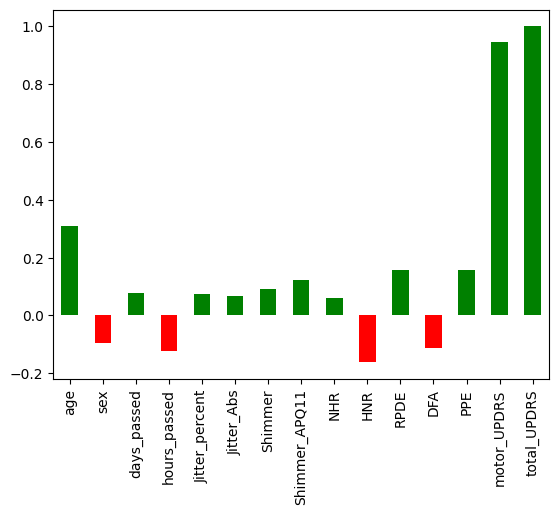

In [23]:
correlations = pd.concat([X, y], axis=1).corr()[['total_UPDRS']]
colors = ['red' if corr < 0 else 'green' for corr in correlations['total_UPDRS'].values]
correlations['total_UPDRS'].plot(kind='bar', color=colors)

There is no strong pearson correlation between independent features and targets features, but:  
* we can see some **negative correlation**.  
* age has most strong correlation with **total_UPDRS** anong others.

Descriptive Statistics

In [ ]:
y.describe()

,motor_UPDRS,total_UPDRS
count,5863.000000,5863.000000
mean,21.289655,29.014090
std,8.133419,10.709966
min,5.037700,7.000000
25%,15.000000,21.362000
50%,20.871000,27.522000
75%,27.594000,36.400500
max,39.511000,54.992000


<Axes: >

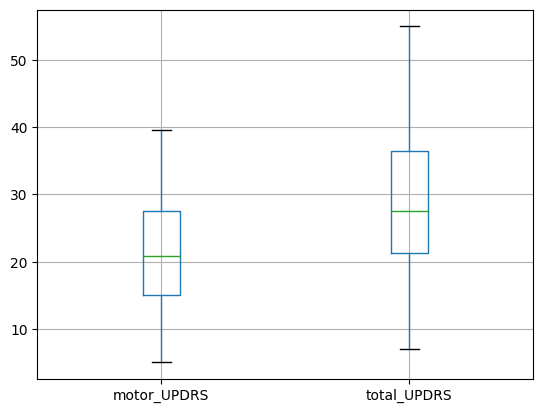

In [ ]:
y.boxplot()

Lets check t-test for `total_UPDRS` and `motor_UPDRS`

In [ ]:
scipy.stats.ttest_rel(y.total_UPDRS, y.motor_UPDRS)

TtestResult(statistic=148.7383794676147, pvalue=0.0, df=5862)

With this test we can say this two variables does not come from same distribution (identical).  
**We used ttest_rel because they are dependent variables**

In [ ]:
np.min(y.total_UPDRS - y.motor_UPDRS)

0.025100000000000122

there is a hypothesis that we can see `total_UPDRS` is combination of somethings with `motor_UPDRS`

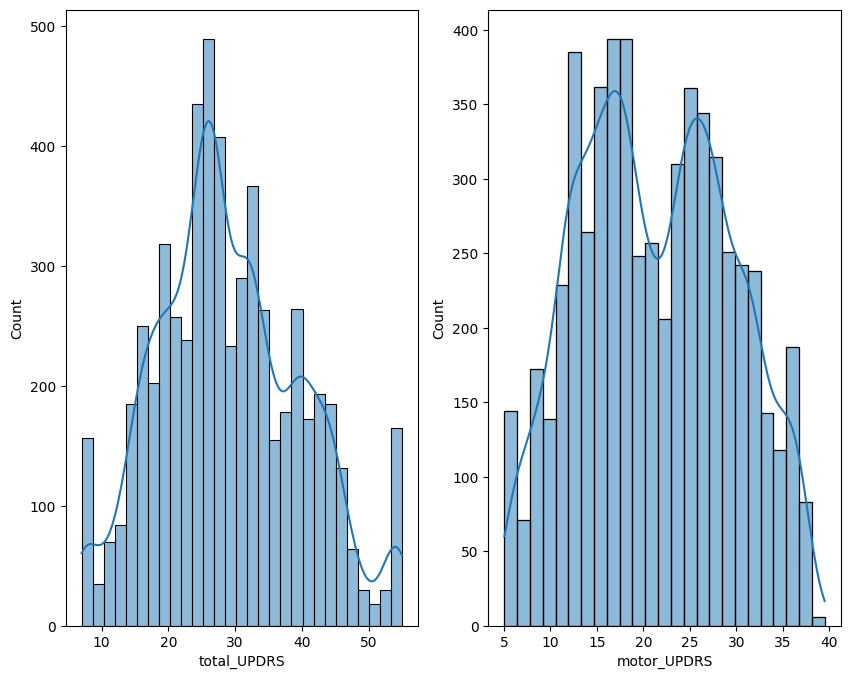

In [ ]:
fig = plt.figure(figsize=(10,8))
ax1 = fig.add_subplot(121)
sns.histplot(y.total_UPDRS, discrete=False, kde=True, stat='count', ax=ax1)


ax2 = fig.add_subplot(122)
sns.histplot(y.motor_UPDRS, discrete=False, kde=True, stat='count', ax=ax2)
plt.show()

In [ ]:
# normality test
scipy.stats.normaltest(y.motor_UPDRS), scipy.stats.normaltest(y.total_UPDRS)

(NormaltestResult(statistic=972.9425932738637, pvalue=5.348109199606311e-212),
 NormaltestResult(statistic=117.25475141104923, pvalue=3.455049251724801e-26))

* they seem like normal distribution or multimoal distribution. but based on normality test it is unlike to say these data come from normal population
* We can not find outliers based on box plot in both target variables


In [ ]:
X.describe()

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
count,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000,5863.000000
mean,64.814771,0.318438,92.530445,12.714651,0.006156,0.000044,0.034038,0.027489,0.032126,21.679527,0.541423,0.653252,0.219618
std,8.827750,0.465910,53.314777,4.613289,0.005628,0.000036,0.025836,0.020002,0.059735,4.292521,0.101024,0.070955,0.091494
min,36.000000,0.000000,0.000000,4.000000,0.000830,0.000002,0.003060,0.002490,0.000286,1.659000,0.151020,0.514040,0.021983
25%,58.000000,0.000000,47.000000,9.000000,0.003580,0.000022,0.019110,0.015660,0.010953,19.404000,0.469695,0.596100,0.156385
50%,65.000000,0.000000,91.000000,11.000000,0.004900,0.000034,0.027530,0.022710,0.018448,21.917000,0.542250,0.643550,0.205560
75%,72.000000,1.000000,138.000000,17.000000,0.006800,0.000053,0.039775,0.032725,0.031464,24.445500,0.614045,0.711480,0.264590
max,85.000000,1.000000,215.000000,23.000000,0.099990,0.000446,0.268630,0.275460,0.748260,37.875000,0.966080,0.865600,0.731730


we can see our data spread smoothly around `zero` based on central tendency and qurtiles except (`age` `sex` `hours_passed`, `days_passed`, `NHR`).  

---

we have multicolinearity and our data spread smoothly around zero, we can easily use this data to unsupervised learning and represent them in latent space

<Axes: xlabel='Shimmer', ylabel='Density'>

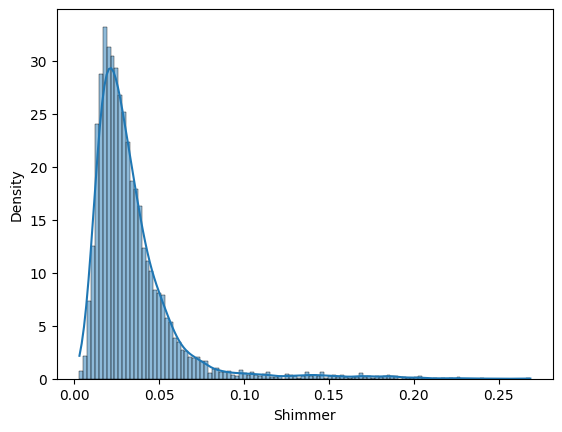

In [ ]:
sns.histplot(X.Shimmer, kde=True, stat='density')

as we can see here it seems normal distribution with right skewness

<Axes: xlabel='Jitter_percent', ylabel='Density'>

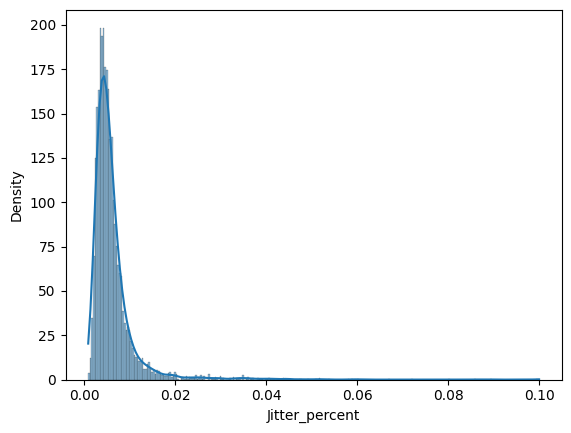

In [ ]:
sns.histplot(X.Jitter_percent, kde=True, stat='density')

<Axes: ylabel='Jitter_percent'>

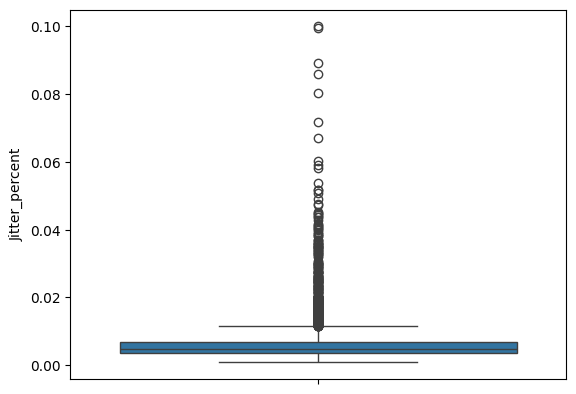

In [ ]:
sns.boxplot(X.Jitter_percent)

we can see here in `Jitter_percent` we have `very right skewned` situation.  
and boxplot confirm this and probably we have some outliers due to measurments error and random nois generator process in an experiment.

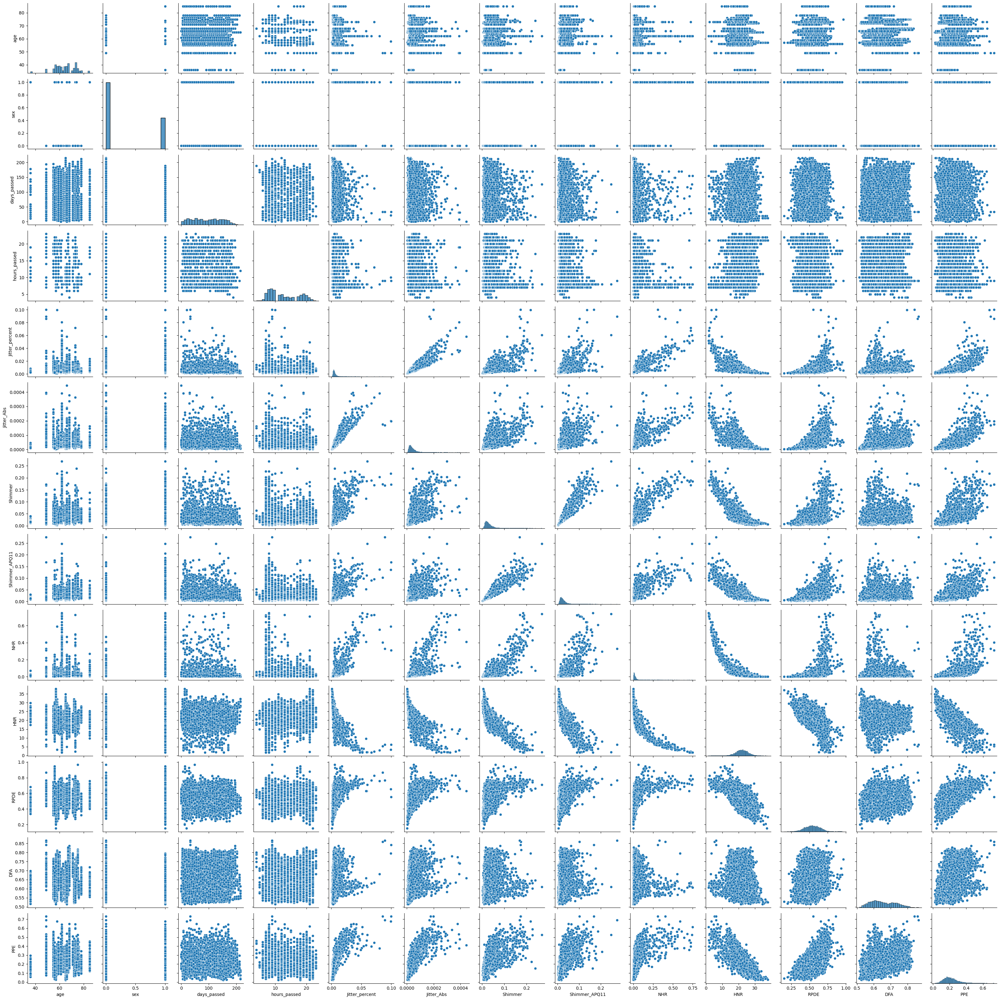

In [ ]:
sns.pairplot(X)

We can see at end of the each plot we have some data points which are far away from rest of the data, probably we had some error in labratoary and so we should remove them to create better model.  
We can obviously see the `correlation between features` and `multicolinarity`, and also `skewness` in distribution of features.  
we check it in next cells.

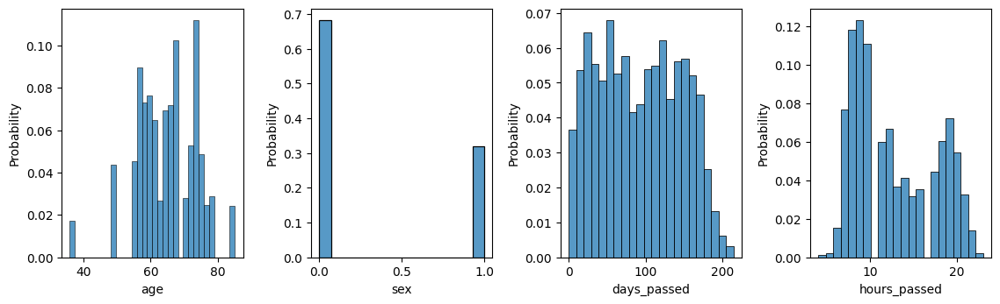

In [ ]:
# countable features
fig = plt.figure(figsize=(20,10))
for i, cls in enumerate(X.select_dtypes('int').columns):
  ax = fig.add_subplot(3,7,i+1)
  sns.histplot(X.loc[:, cls], kde=False, stat='probability', ax=ax)
plt.tight_layout()

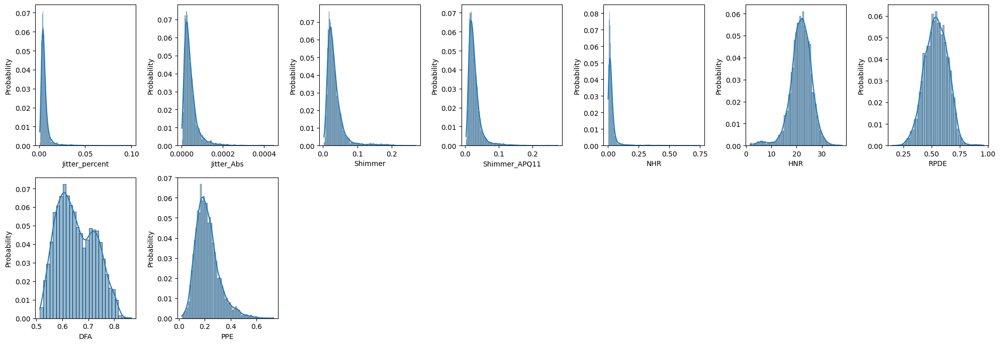

In [ ]:
# not countable features
fig = plt.figure(figsize=(20,10))
for i, cls in enumerate(X.select_dtypes('float').columns):
  ax = fig.add_subplot(3,7,i+1)
  sns.histplot(X.loc[:, cls], kde=True, stat='probability', ax=ax)
plt.tight_layout()

Except `PRDE`, `PPE`, `HNR` and `DFA` we have `highly skewness` in other features.  
we have at least some outliers in dataset with these highly skeweed features,  and this **skewed data** will **deviate** our model from percise answer.  

---

for example if you look at the scatter plot of `sex` and `shimmer_APQ11` we can see in female data we have a point that is very far away from rest of the female points.

In [ ]:
X.skew()

age              -0.382077
sex               0.779654
days_passed       0.079723
hours_passed      0.439588
Jitter_percent    6.450972
Jitter_Abs        3.283129
Shimmer           3.314150
Shimmer_APQ11     3.404656
NHR               6.547359
HNR              -0.810924
RPDE             -0.037453
DFA               0.281782
PPE               1.088670
dtype: float64

we see that our features most of them have `right skewness` and `multicolinearity`, we should deal with these situation to create robust regression model.

# Outlier Detection

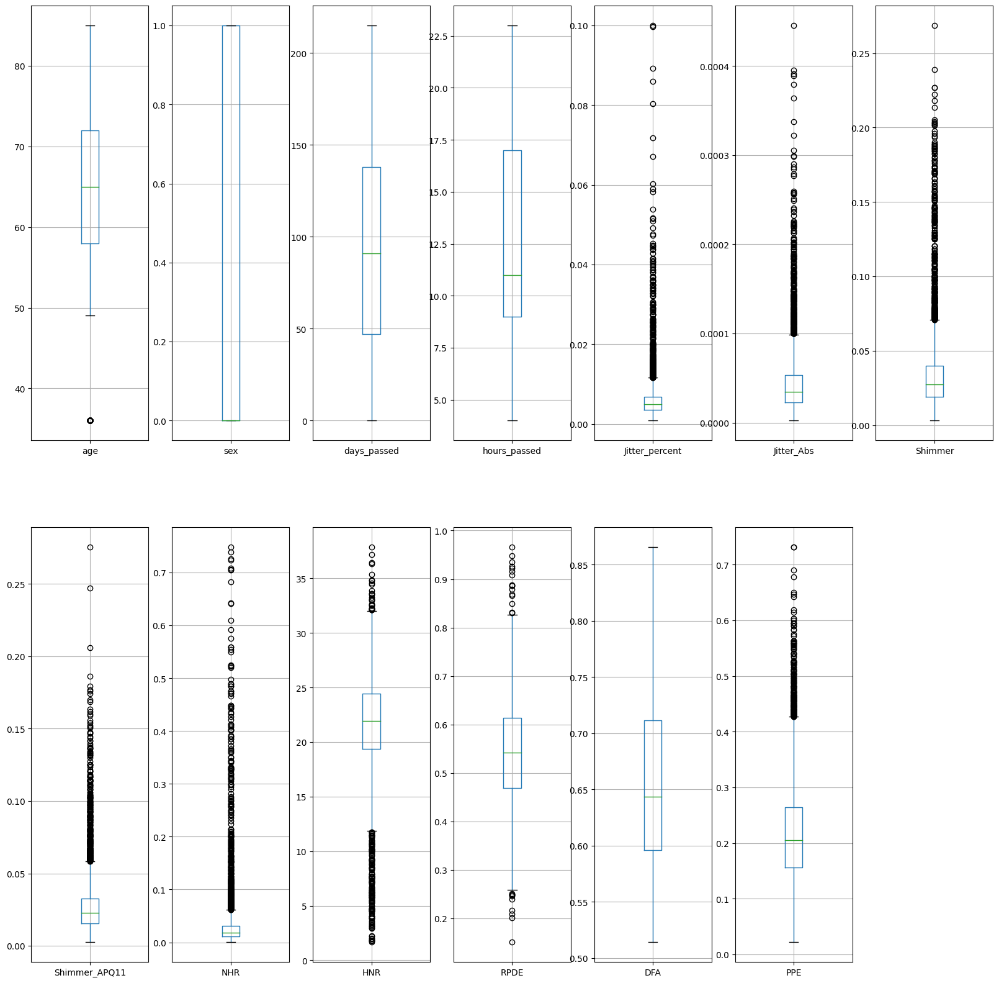

In [ ]:
fig = plt.figure(figsize=(20,20))
for index, i in enumerate(X.columns):
  ax = fig.add_subplot(2,7,index+1)
  X[[i]].boxplot(ax=ax)
  # plt.show()

Lets use Standard scaler method

In [22]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)
scaled_data_df = pd.DataFrame(scaled_data, columns=scaler.get_feature_names_out())

In [25]:
np.sum(np.abs(scaled_data_df) > 3)

age               101
sex                 0
days_passed         0
hours_passed        0
Jitter_percent    107
Jitter_Abs        115
Shimmer           141
Shimmer_APQ11     134
NHR               112
HNR               103
RPDE               18
DFA                 0
PPE                75
dtype: int64

In [23]:
outliers = {}
for i in scaled_data_df.columns:
  mask = np.abs(scaled_data_df.loc[:, i]) > 3
  outliers[i] = mask

In [27]:
outliers['age'].sum()

101

we store outliers mask based on standard scaler method in outliers dictionary

In [28]:
scaled_data_df.columns

Index(['age', 'sex', 'days_passed', 'hours_passed', 'Jitter_percent',
       'Jitter_Abs', 'Shimmer', 'Shimmer_APQ11', 'NHR', 'HNR', 'RPDE', 'DFA',
       'PPE'],
      dtype='object')

In [29]:
scaler.inverse_transform(scaled_data_df[outliers['HNR']])[:, 9]

array([ 7.496,  2.206,  4.574,  5.455,  6.466,  8.536,  7.172,  3.295,
       34.795, 36.448, 37.187, 37.875, 36.309, 35.375, 34.836,  5.237,
        6.197,  6.199,  2.964,  4.739,  6.206,  5.964,  5.983,  8.512,
        8.478,  6.757,  5.749,  8.277,  7.892,  3.993,  3.629,  1.945,
        7.987,  4.283,  1.853,  4.673,  4.082,  3.857,  3.495,  1.799,
        7.558,  5.488,  8.723,  6.579,  5.979,  3.997,  7.692,  3.392,
        3.861,  5.8  ,  4.459,  3.902,  5.55 ,  5.764,  6.311,  2.945,
        5.008,  1.998,  5.366,  5.275,  1.811,  7.674,  2.236,  4.791,
        6.237,  6.24 ,  1.659,  3.096,  8.425,  6.41 ,  4.509,  6.653,
        6.709,  4.638,  7.892,  4.679,  6.478,  3.175,  5.952,  4.534,
        5.974,  7.629,  5.827,  4.681,  7.648,  6.092,  7.158,  7.303,
        6.33 ,  7.289,  7.476,  6.942,  5.802,  8.385,  7.152,  7.566,
        7.224,  5.683,  7.101,  5.941,  7.669,  7.882,  4.992])

we can see here we consider 7.49 as outlier and on the other hand in box plot we did not. so i think here we should be more conservative in this medical field and do not use StandardScaler method to detect outlier

We try to remove very last datapoints in each columns

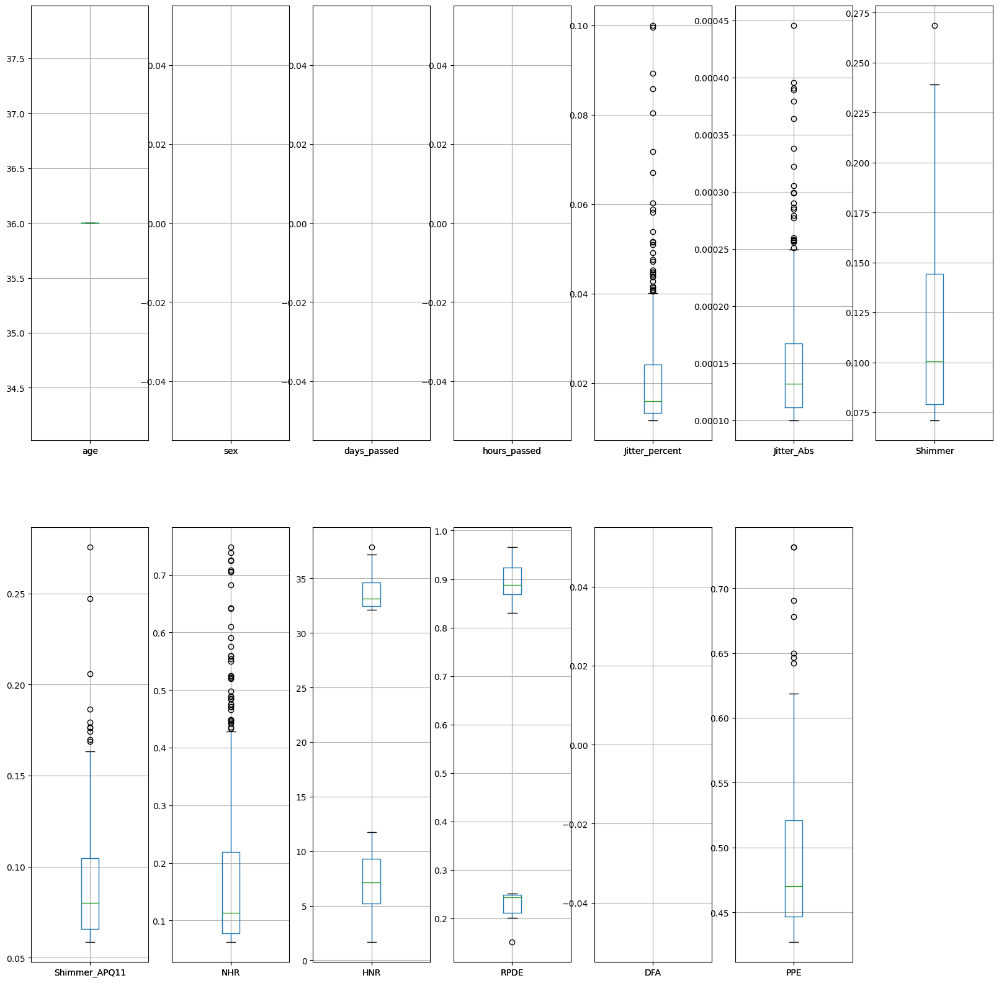

In [ ]:
fig = plt.figure(figsize=(20,20))
for index, i in enumerate(X.columns):
  ax = fig.add_subplot(2,7,index+1)
  iqr = np.percentile(X[i], 75) - np.percentile(X[i], 25)
  upper_limit = np.percentile(X[i], 75) + 1.5 * iqr
  lower_limit = np.percentile(X[i], 25) - 1.5 * iqr
  X[X[i] > upper_limit][[i]].boxplot(ax=ax)
  X[X[i] < lower_limit][[i]].boxplot(ax=ax)


In [ ]:
# X_org = X.copy()

In [ ]:
# X = X_org.copy()

Here we want to remove some datapints from X set thus we should remove them also from y set

In [24]:
X = pd.concat([X, y], axis='columns')

In [25]:
X.isnull().sum()

age               0
sex               0
days_passed       0
hours_passed      0
Jitter_percent    0
Jitter_Abs        0
Shimmer           0
Shimmer_APQ11     0
NHR               0
HNR               0
RPDE              0
DFA               0
PPE               0
motor_UPDRS       0
total_UPDRS       0
dtype: int64

In [26]:
def remove_o(data):
  iqr = np.percentile(data, 75) - np.percentile(data, 25)
  upper_limit = np.percentile(data, 75) + 1.5 * iqr
  lower_limit = np.percentile(data, 25) - 1.5 * iqr
  mask1 = data > upper_limit
  mask2 = data < lower_limit
  # extract only true values
  mask1 = mask1[mask1]
  mask2 = mask2[mask2]
  return mask1, mask2


for index, i in enumerate(X.columns):
  iqr = np.percentile(X[i], 75) - np.percentile(X[i], 25)
  upper_limit = np.percentile(X[i], 75) + 1.5 * iqr
  lower_limit = np.percentile(X[i], 25) - 1.5 * iqr
  new_1 = X[X[i] > upper_limit][[i]]
  new_2 = X[X[i] < lower_limit][[i]]
  # print(new_1.size)
  if new_1.size > 0:
    mask1, mask2 = remove_o(new_1)
    if mask1.sum()[0] != 0:
      X.drop(mask1.index, inplace=True, axis=0)
    if mask2.sum()[0] != 0:
      X.drop(mask2.index, inplace=True, axis=0)
  if new_2.size > 0:
    mask1, mask2 = remove_o(new_2)
    if mask1.sum()[0] != 0:
      X.drop(mask1.index, inplace=True, axis=0)
    if mask2.sum()[0] != 0:
      X.drop(mask2.index, inplace=True, axis=0)
    # print(mask1.sum())
    # print(new_2)
    #

We make data little bit smoother and one thing else is age 36 which is away from other age but it seems we had an patient in this age we remove it also

In [27]:
X.drop(X.age[(X.age == 36)].index, inplace=True)

Separate X and y

In [28]:
X.columns[-2:]

Index(['motor_UPDRS', 'total_UPDRS'], dtype='object')

In [29]:
y = X[X.columns[-2:]]
X = X[X.columns[:-2]]

In [30]:
X.head()

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
0,72,0,5,15,0.00662,0.000034,0.02565,0.01662,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12,16,0.00300,0.000017,0.02024,0.01689,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19,16,0.00481,0.000025,0.01675,0.01458,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25,16,0.00528,0.000027,0.02309,0.01963,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33,15,0.00335,0.000020,0.01703,0.01819,0.011625,26.126,0.47188,0.56122,0.19361


In [31]:
y.head()

,motor_UPDRS,total_UPDRS
0,28.199,34.398
1,28.447,34.894
2,28.695,35.389
3,28.905,35.810
4,29.187,36.375


In [32]:
X.tail()


,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
5858,61,0,142,19,0.00406,0.000031,0.01896,0.01549,0.025137,22.369,0.64215,0.55314,0.21367
5859,61,0,149,20,0.00297,0.000025,0.02315,0.01904,0.011927,22.886,0.52598,0.56518,0.12621
5860,61,0,156,20,0.00349,0.000025,0.02499,0.01877,0.017701,25.065,0.47792,0.57888,0.14157
5861,61,0,163,18,0.00281,0.000020,0.01484,0.01307,0.007984,24.422,0.56865,0.56327,0.14204
5862,61,0,170,18,0.00282,0.000021,0.01907,0.01470,0.008172,23.259,0.58608,0.57077,0.15336


In [33]:
X.reset_index(drop=True, inplace=True)
y.reset_index(drop=True, inplace=True)

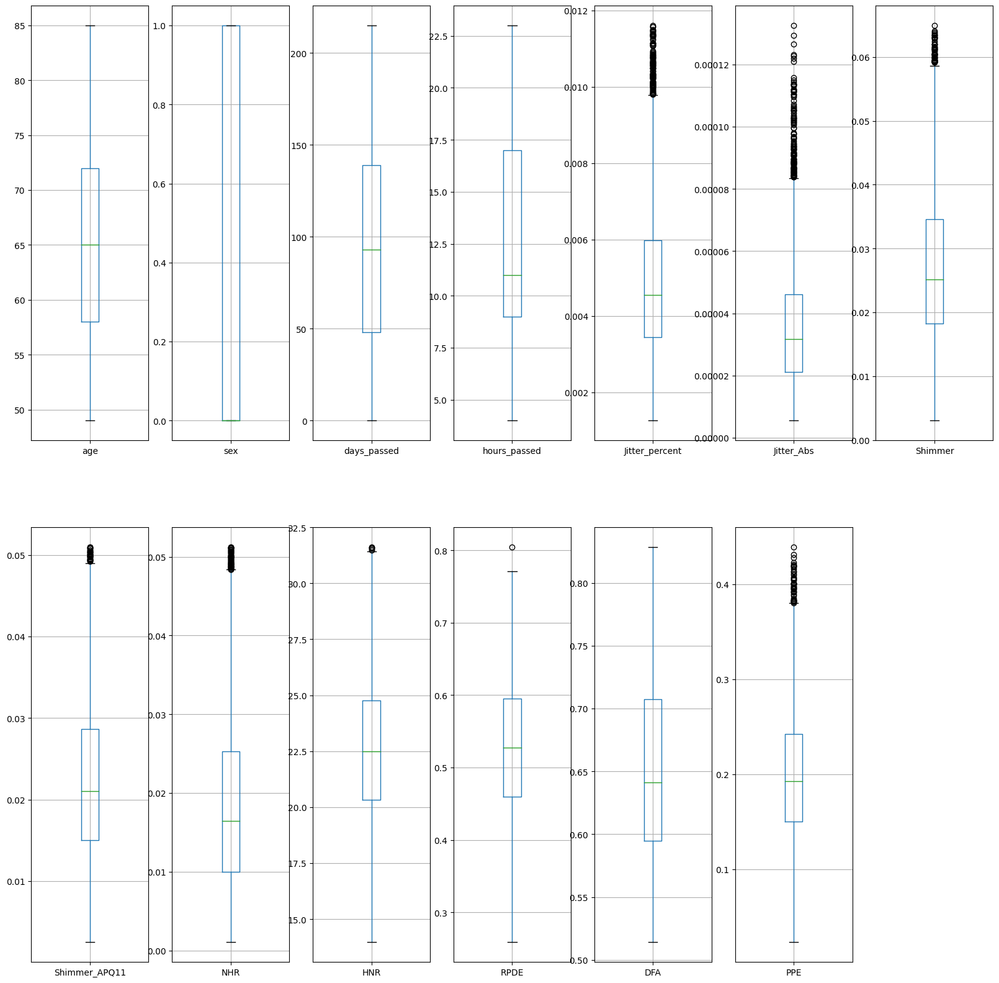

In [34]:
fig = plt.figure(figsize=(20,20))
for index, i in enumerate(X.columns):
  ax = fig.add_subplot(2,7,index+1)
  X[[i]].boxplot(ax=ax)
  # plt.show()

In [35]:
X.shape, y.shape

((4858, 13), (4858, 2))

In [36]:
X.tail()

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
4853,61,0,142,19,0.00406,0.000031,0.01896,0.01549,0.025137,22.369,0.64215,0.55314,0.21367
4854,61,0,149,20,0.00297,0.000025,0.02315,0.01904,0.011927,22.886,0.52598,0.56518,0.12621
4855,61,0,156,20,0.00349,0.000025,0.02499,0.01877,0.017701,25.065,0.47792,0.57888,0.14157
4856,61,0,163,18,0.00281,0.000020,0.01484,0.01307,0.007984,24.422,0.56865,0.56327,0.14204
4857,61,0,170,18,0.00282,0.000021,0.01907,0.01470,0.008172,23.259,0.58608,0.57077,0.15336


# Unsupervised analysis

Here we try to use `deep learning` and `classic machine learning` unsupervised algorithms to understand better our dataset.

First we try `PCA` to decrease dimension then we use `autoencoder` and after that we `compare` these two after that we can use `clustering algorithms` and `visualizations` to better understand embedded data in latent space.

---

**Note:** By this work we hope to decrease `multicolinearity`

## Principal Component Analysis

we have to do scaling and then perform PCA, if we do not do that it may lead us to incorrect interpretation of data.


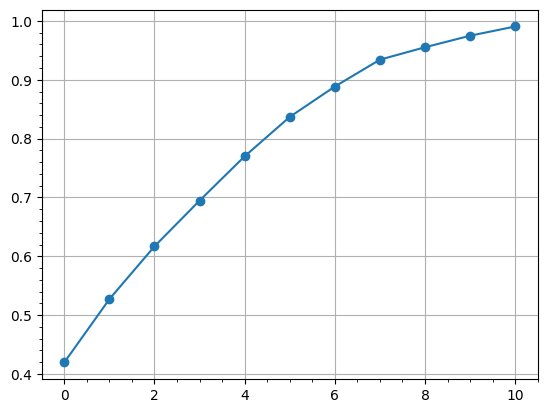

In [38]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)
scaled_data_df = pd.DataFrame(scaled_data, columns=scaler.get_feature_names_out())
pca = PCA(0.99)
pca.fit(scaled_data)

plt.plot(np.cumsum(pca.explained_variance_ratio_), ls='-', marker='o')
plt.minorticks_on()
plt.grid(True)

After `6` components we explained more than `91 percent` of variation of data.  
We extract 7 components

In [39]:
pca = PCA(7)
pca_trans = pca.fit_transform(scaled_data)
pca_trans = pd.DataFrame(pca_trans, columns=['PC1','PC2', 'PC3', 'PC4','PC5', 'PC6', 'PC7'])

Make plot with first two components

<Axes: xlabel='PC1', ylabel='PC2'>

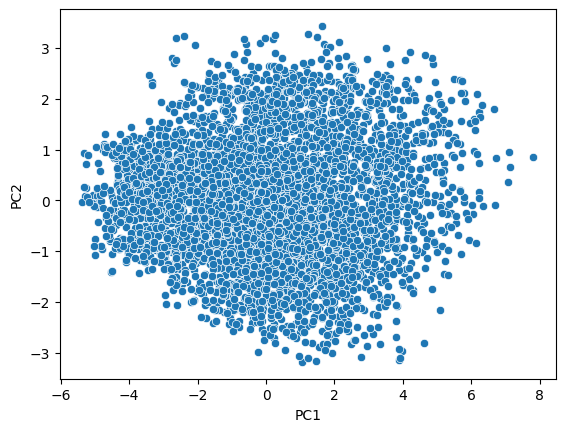

In [40]:
sns.scatterplot(x=pca_trans.iloc[:,0], y=pca_trans.iloc[:,1])

use pairplot method to get a grid of plots

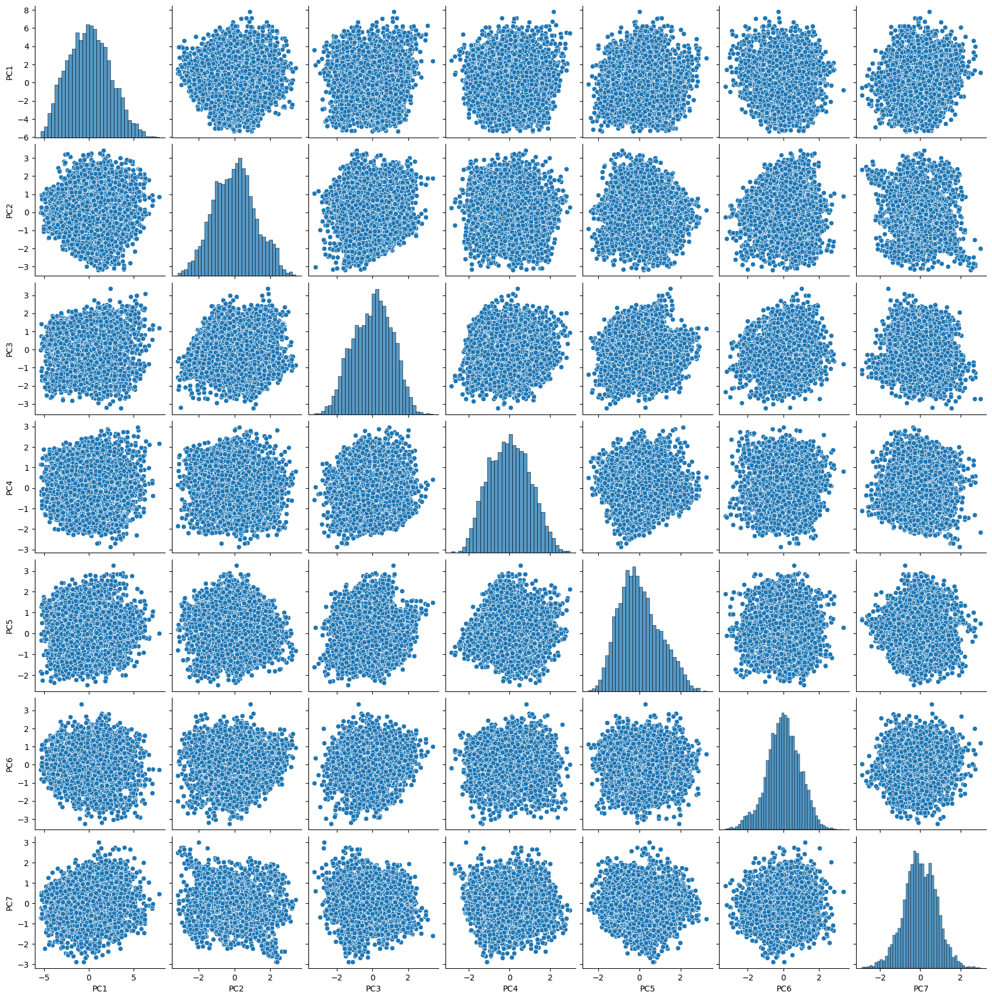

In [ ]:
sns.pairplot(pca_trans)

We can see some clustering between `PC2, PC7`  

In [ ]:
pca_trans.corr().style.background_gradient(cmap='coolwarm')

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
PC1,1.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000
PC2,-0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000
PC3,0.000000,-0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000
PC4,-0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,-0.000000
PC5,-0.000000,-0.000000,-0.000000,0.000000,1.000000,-0.000000,0.000000
PC6,0.000000,0.000000,0.000000,-0.000000,-0.000000,1.000000,0.000000
PC7,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,1.000000


This principal component analysis we overcome `multicolinearity`issue.

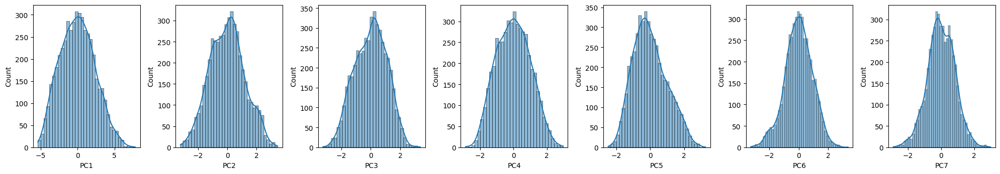

In [ ]:
fig = plt.figure(figsize=(20,10))
for i in range(0, len(pca_trans.columns)):
  ax = fig.add_subplot(3,7,i+1)
  sns.histplot(pca_trans.iloc[:, i], kde=True, ax=ax)
plt.tight_layout()

In [41]:
pca_trans.skew()

PC1    0.180032
PC2    0.089416
PC3   -0.110280
PC4    0.080655
PC5    0.375550
PC6   -0.164168
PC7   -0.073484
dtype: float64

Also here we can see distribution of our data is less skewed and we do not have `skewness` more than `0.5` or less than `-0.5`

Lets plot these components with target variables

In [ ]:
pca_trans.shape, y.shape

((4858, 7), (4858, 2))

In [42]:
merge_pca_df = pd.concat([pca_trans, y], axis='columns')

In [43]:
merge_pca_df.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,motor_UPDRS,total_UPDRS
count,4.858000e+03,4.858000e+03,4.858000e+03,4.858000e+03,4.858000e+03,4858.000000,4.858000e+03,4858.000000,4858.000000
mean,-4.680397e-17,-1.170099e-17,7.020595e-17,5.265446e-17,-1.170099e-17,0.000000,-1.170099e-17,21.232010,29.073264
std,2.335576e+00,1.182632e+00,1.079990e+00,1.005438e+00,9.895851e-01,0.933212,8.193024e-01,8.176321,10.781885
min,-5.367807e+00,-3.184171e+00,-3.245692e+00,-2.862557e+00,-2.480714e+00,-3.254904,-2.892636e+00,5.037700,7.000000
25%,-1.736961e+00,-8.644015e-01,-8.016504e-01,-7.687401e-01,-7.377066e-01,-0.596120,-5.303736e-01,14.759750,21.324000
50%,-3.957696e-02,8.766085e-03,7.256570e-02,-4.557422e-03,-1.104963e-01,0.016562,-1.004461e-02,20.585500,27.473000
75%,1.633406e+00,7.697493e-01,8.017123e-01,7.304362e-01,6.581481e-01,0.627380,5.670381e-01,27.689000,36.846000
max,7.807091e+00,3.435693e+00,3.368774e+00,2.965737e+00,3.257703e+00,3.355252,2.988070e+00,39.511000,54.992000


We have comparable STD for `PC2, PC1, PC7` with STD of `motor_UPDRS`.  
Lets plot them

<Axes: xlabel='PC7', ylabel='motor_UPDRS'>

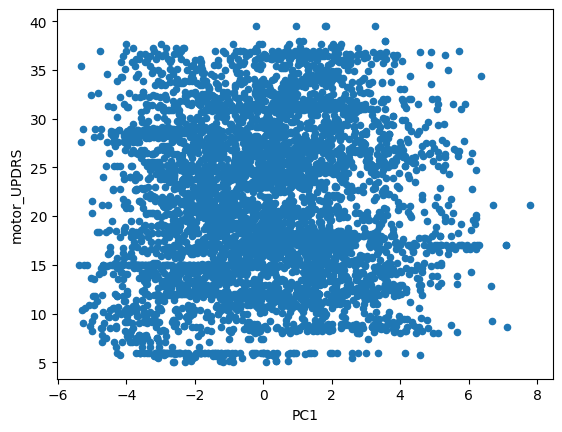

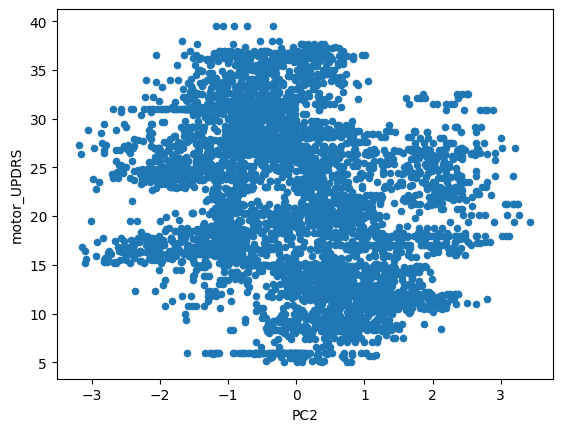

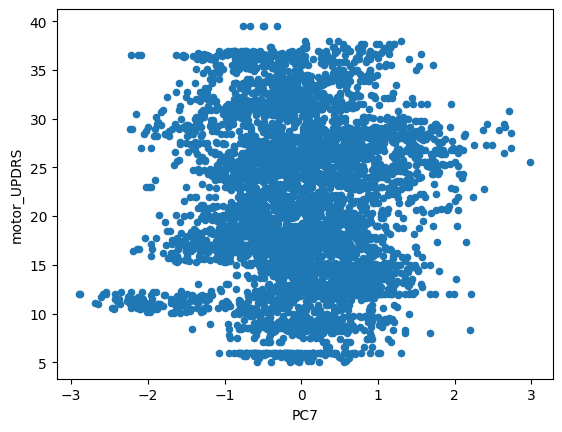

In [44]:
merge_pca_df.plot(kind='scatter', x='PC1', y='motor_UPDRS')
merge_pca_df.plot(kind='scatter', x='PC2', y='motor_UPDRS')
merge_pca_df.plot(kind='scatter', x='PC7', y='motor_UPDRS')

3D plot

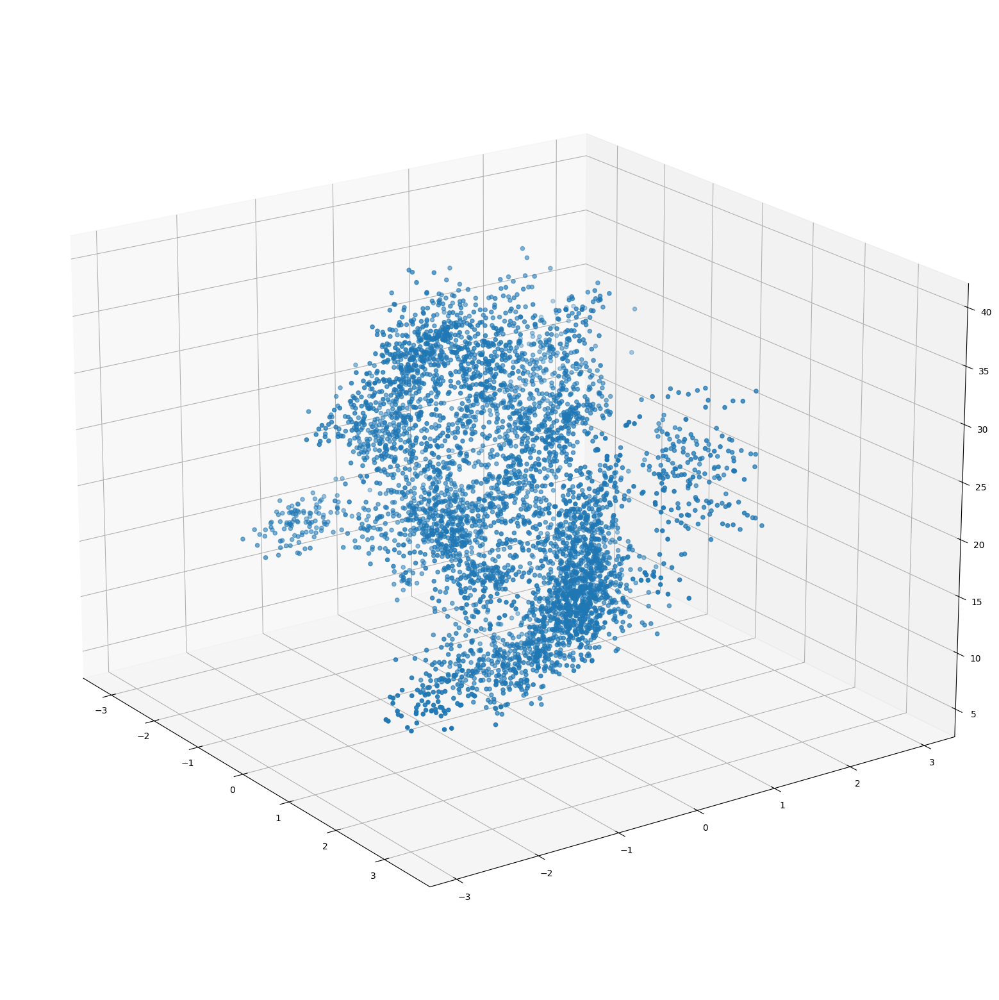

In [ ]:
fig = plt.figure(figsize=(30,20))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(xs=pca_trans['PC2'],  ys=pca_trans['PC7'], zs=y.motor_UPDRS)
ax.view_init(elev=20., azim=-35, roll=0)

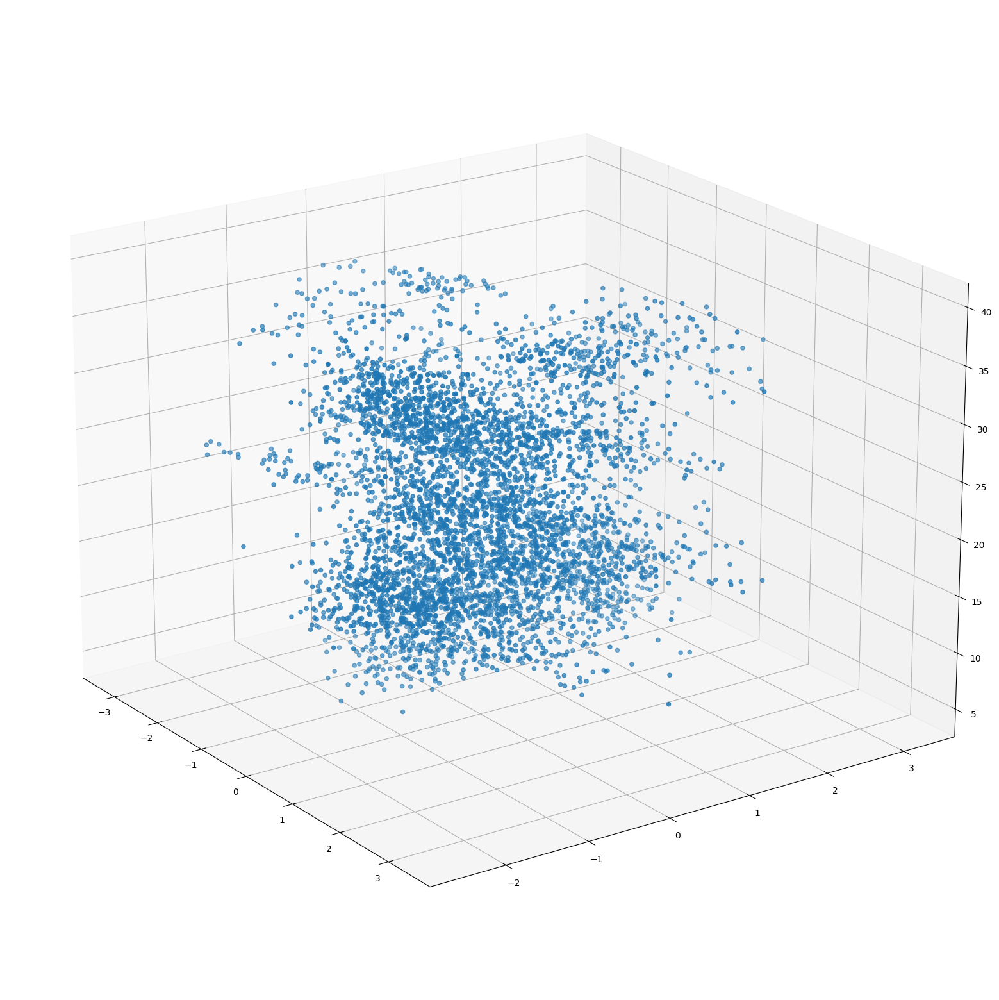

In [ ]:
fig = plt.figure(figsize=(30,20))
ax = fig.add_subplot(projection='3d')
ax.scatter3D(xs=pca_trans['PC6'],  ys=pca_trans['PC5'], zs=y.motor_UPDRS)
ax.view_init(elev=20., azim=-35, roll=0)

<Axes: >

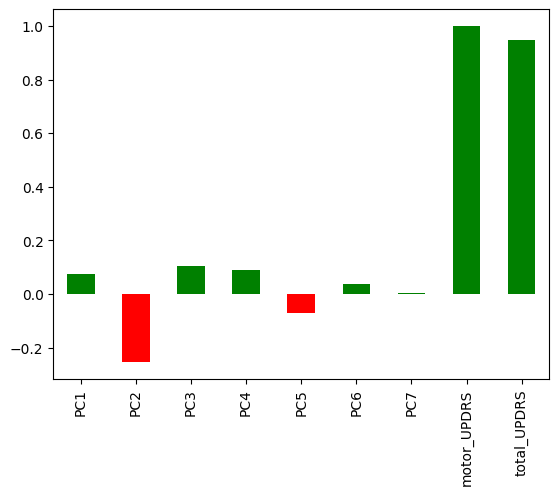

In [45]:
correlations = merge_pca_df.corr()[['motor_UPDRS']]
colors = ['red' if corr < 0 else 'green' for corr in correlations['motor_UPDRS'].values]
correlations['motor_UPDRS'].plot(kind='bar', color=colors)

We do have same correlation as before but here we can see in 3D plot that we may have some cluster in our data.

In [46]:
pca.components_[1]

array([-0.63059602, -0.20610371,  0.0380663 ,  0.2047589 ,  0.14243094,
        0.24322029, -0.29561273, -0.28994512, -0.10275204,  0.07966263,
       -0.00651187,  0.48818435,  0.10161917])

i above cell we can see how much is the magnitude of correlation of PC2 and each features in original dataset, we do more analysis in following cells  
**Here i show PC 2 becuse it has relatively strong negative corelation with motor_UPDRS and it is why we want to see PC 2 contains from what**  

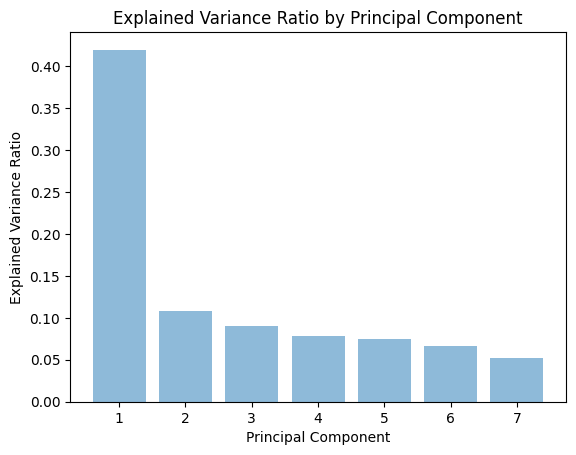

In [47]:
# Accessing the principal components
components = pca.components_

# Accessing the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Number of components
n_components = pca.n_components_

# Plotting the explained variance ratio
plt.bar(range(1, n_components + 1), explained_variance_ratio, alpha=0.5, align='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.show()


In [48]:
# Printing the explained variance ratio for each component
print("Explained Variance Ratio:")
for i, explained_variance in enumerate(explained_variance_ratio):
    print(f"PC{i + 1}: {explained_variance:.4f}")

Explained Variance Ratio:
PC1: 0.4195
PC2: 0.1076
PC3: 0.0897
PC4: 0.0777
PC5: 0.0753
PC6: 0.0670
PC7: 0.0516


In [ ]:
# Printing the components
print(f'Corresponded Features: {X.columns.to_list()}',"\nPrincipal Components:")
for i, component in enumerate(components):
    print(f"PC{i + 1}: {component}")
    print('-----'*10)


Corresponded Features: ['age', 'sex', 'days_passed', 'hours_passed', 'Jitter_percent', 'Jitter_Abs', 'Shimmer', 'Shimmer_APQ11', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE'] 
Principal Components:
PC1: [ 0.08835432 -0.13530493 -0.01188127  0.03673166  0.36615036  0.36801959
  0.32699743  0.3337261   0.32078021 -0.37031589  0.26996517  0.20517974
  0.35996813]
--------------------------------------------------
PC2: [-0.63059602 -0.20610371  0.0380663   0.2047589   0.14243094  0.24322029
 -0.29561273 -0.28994512 -0.10275204  0.07966263 -0.00651187  0.48818435
  0.10161917]
--------------------------------------------------
PC3: [ 0.10602915 -0.29620561 -0.15512499 -0.70478885  0.12413194  0.22682562
 -0.33489377 -0.27202788  0.06588147  0.09824055  0.21301589 -0.22174053
  0.13667905]
--------------------------------------------------
PC4: [ 0.17783741  0.3166798   0.85325918 -0.15696309  0.19305441  0.0699673
 -0.13202298 -0.12284535  0.03624622  0.04020145 -0.11414242  0.09153459
  0.1279673 ]


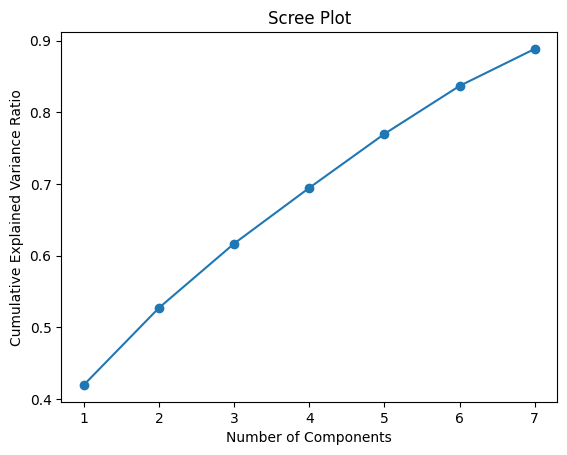

In [ ]:
# Scree Plot
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.plot(range(1, n_components + 1), cumulative_variance_ratio, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Scree Plot')
plt.show()
# see with each number of PC how much variation of original dataset we can explain

In [ ]:
pca.components_[0:2, :]

array([[ 0.08835432, -0.13530493, -0.01188127,  0.03673166,  0.36615036,
         0.36801959,  0.32699743,  0.3337261 ,  0.32078021, -0.37031589,
         0.26996517,  0.20517974,  0.35996813],
       [-0.63059602, -0.20610371,  0.0380663 ,  0.2047589 ,  0.14243094,
         0.24322029, -0.29561273, -0.28994512, -0.10275204,  0.07966263,
        -0.00651187,  0.48818435,  0.10161917]])

In [ ]:
np.transpose(pca.components_[0:2, :]).shape

(13, 2)

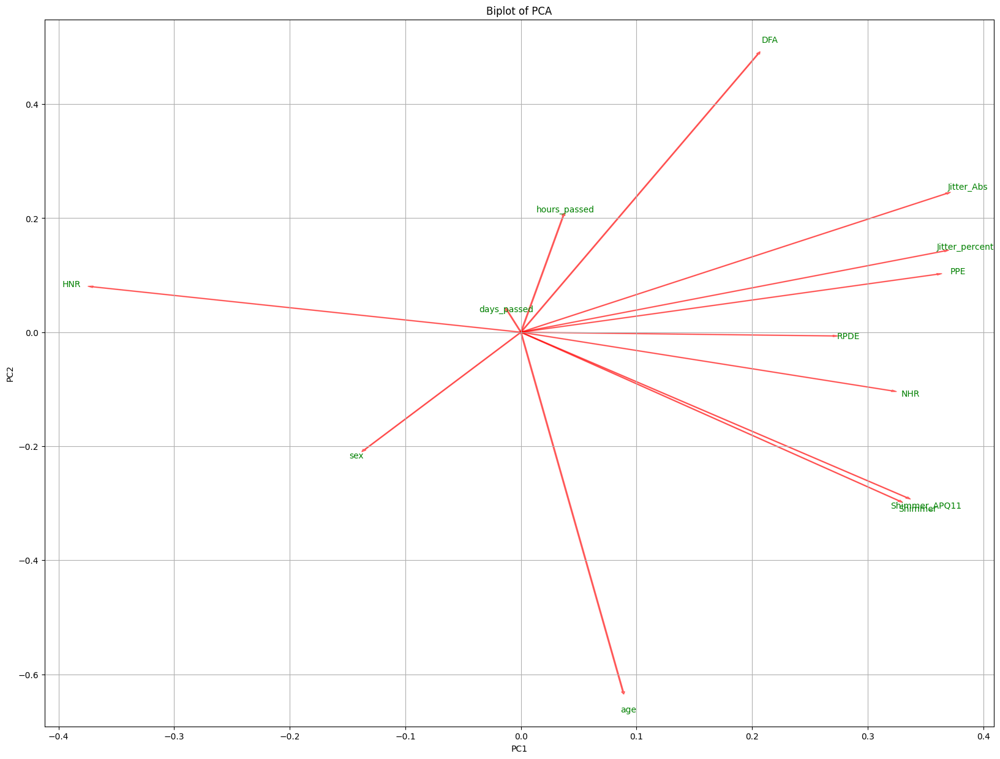

In [ ]:
feature_names = X.columns.to_list()
# Biplot
def biplot(score, coeff, labels=None, scatter=True):
    plt.figure(figsize=(20, 15))
    if scatter == True:
      plt.scatter(score[:,0], score[:,1], alpha=0.5)
    if scatter == False:
      for i in range(coeff.shape[0]):
          plt.arrow(0, 0, coeff[i,0], coeff[i,1], color='r', alpha=0.5)
          if labels is not None:
              plt.text(coeff[i,0]* 1.05, coeff[i,1] * 1.05, labels[i], color='g', ha='center', va='center')
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.grid()

biplot(pca.transform(X)[:,0:2], np.transpose(pca.components_[0:2, :]), labels=feature_names, scatter=False) # Assuming feature_names is a list of your feature names
plt.title('Biplot of PCA')
plt.show()

Here we plot coeff of each original features in PC1 and PC2 in 2D graph and we can see how they are close or far from each other in these two components or how they are strong in each components.  
**It can be assume as some sort of embedding space for original features with(in) two dims(PC1, PC2)**

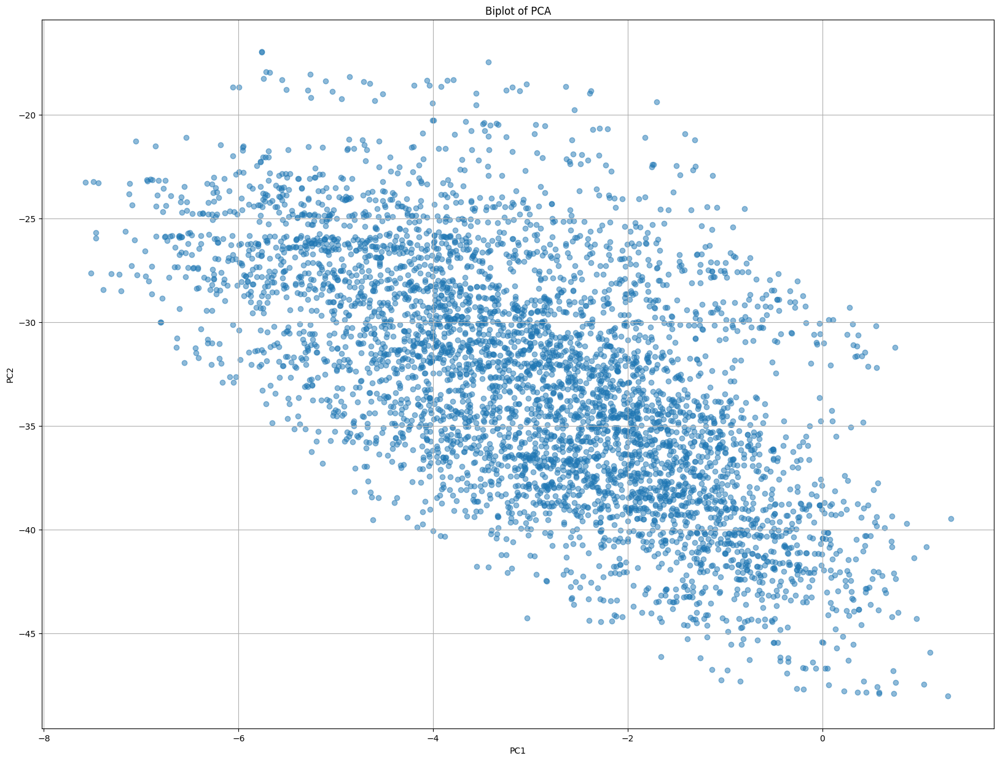

In [ ]:
biplot(pca.transform(X)[:,0:2], np.transpose(pca.components_[0:2, :]), labels=feature_names, scatter=True) # Assuming feature_names is a list of your feature names
plt.title('Biplot of PCA')
plt.show()

In [ ]:
# Feature Importance
feature_importance = np.abs(pca.components_)

# Printing Feature Importance
print("\nFeature Importance:")
for i, importance in enumerate(feature_importance):
    print(f"PC{i + 1}:")
    for j, feature in enumerate(feature_names):
        print(f"{feature}: {importance[j]:.4f}")
    print('---'*15)


Feature Importance:
PC1:
age: 0.0884
sex: 0.1353
days_passed: 0.0119
hours_passed: 0.0367
Jitter_percent: 0.3662
Jitter_Abs: 0.3680
Shimmer: 0.3270
Shimmer_APQ11: 0.3337
NHR: 0.3208
HNR: 0.3703
RPDE: 0.2700
DFA: 0.2052
PPE: 0.3600
---------------------------------------------
PC2:
age: 0.6306
sex: 0.2061
days_passed: 0.0381
hours_passed: 0.2048
Jitter_percent: 0.1424
Jitter_Abs: 0.2432
Shimmer: 0.2956
Shimmer_APQ11: 0.2899
NHR: 0.1028
HNR: 0.0797
RPDE: 0.0065
DFA: 0.4882
PPE: 0.1016
---------------------------------------------
PC3:
age: 0.1060
sex: 0.2962
days_passed: 0.1551
hours_passed: 0.7048
Jitter_percent: 0.1241
Jitter_Abs: 0.2268
Shimmer: 0.3349
Shimmer_APQ11: 0.2720
NHR: 0.0659
HNR: 0.0982
RPDE: 0.2130
DFA: 0.2217
PPE: 0.1367
---------------------------------------------
PC4:
age: 0.1778
sex: 0.3167
days_passed: 0.8533
hours_passed: 0.1570
Jitter_percent: 0.1931
Jitter_Abs: 0.0700
Shimmer: 0.1320
Shimmer_APQ11: 0.1228
NHR: 0.0362
HNR: 0.0402
RPDE: 0.1141
DFA: 0.0915
PPE: 0.12

We can see Importance of each original Features in each components of Principal Components Analysis.

In [ ]:
pca_trans.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,-0.596590,-0.790984,0.425987,-1.397153,0.369580,0.393715,-1.310076
1,-2.661247,-0.886867,0.002089,-1.717871,-0.345632,0.258656,-1.414410
2,-1.039201,-0.676797,0.612546,-1.220070,0.082754,1.145979,-1.380386
3,0.317440,-0.538083,0.612381,-0.916493,0.278761,1.041869,-1.509060
4,-1.896467,-0.738516,0.449547,-1.179560,-0.351433,0.386239,-1.342875


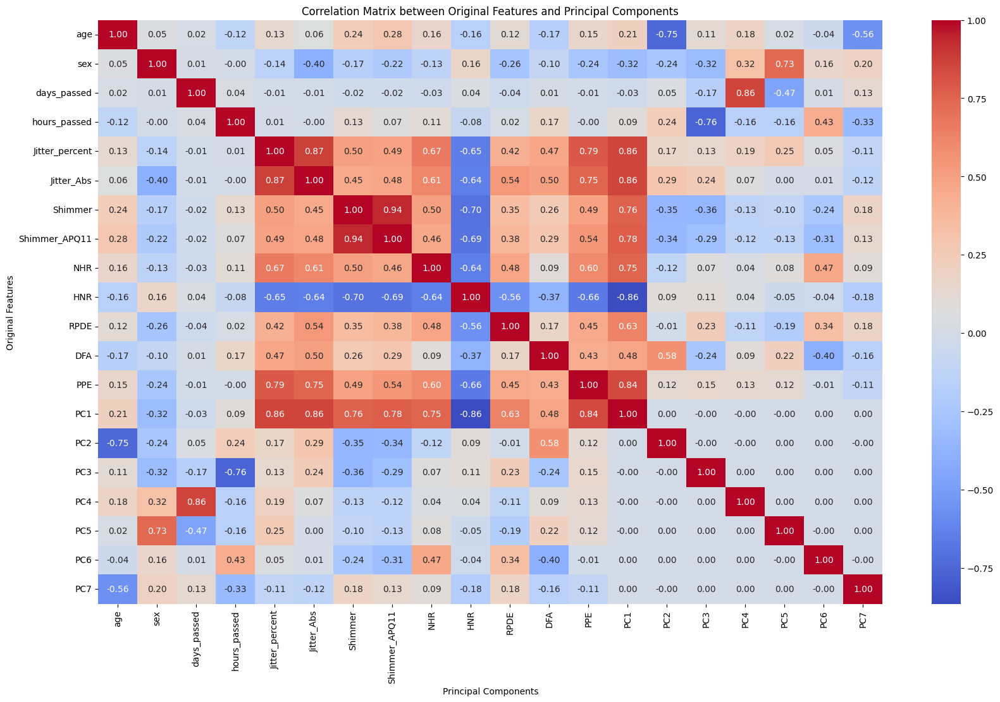

In [ ]:
# Correlation Matrix
pc_corr_matrix = np.corrcoef(X.T, pca_trans.T)
pc_corr_matrix.shape

# Number of components
n_components = pca.n_components_
all_ticks = feature_names + ['PC'+str(i+1) for i in range(n_components)]

# Plotting Correlation Matrix
plt.figure(figsize=(20, 12))
sns.heatmap(pc_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", xticklabels=all_ticks, yticklabels=all_ticks)
plt.title('Correlation Matrix between Original Features and Principal Components')
plt.xlabel('Principal Components')
plt.ylabel('Original Features')
plt.show()

Here we have lots of usefull information that show us relation between `components of PCA` and `original features`

## AutoEncoder  
We try to leverage AE Network ability to reduce dimension and create more useful features.

### Dimension Reduction

We have to create structure of our deep learning model first.

In [49]:
def my_AE_V1():
  # clear session
  tf.keras.backend.clear_session()
  #Encode part
  inp = tf.keras.layers.Input(shape=(X.shape[1],))
  x = tf.keras.layers.Dense(units=15, activation='relu')(inp)
  x = tf.keras.layers.Dense(units=10, activation='relu')(x)
  x = tf.keras.layers.Dense(units=7, activation=None, name='LatentSpace_layer')(x)
  # create Encode model
  enc = tf.keras.Model(inp, x, name='Encoder')
  #Decoder part
  inp_2 = tf.keras.layers.Input(shape=(7,)) # just like PCA that we had 7 components
  x = tf.keras.layers.Dense(units=10, activation='relu')(inp_2)
  x = tf.keras.layers.Dense(units=15, activation='relu')(x)
  x = tf.keras.layers.Dense(units=X.shape[1], activation=None, name='Reconstruction_Layer')(x)
  # create decoder model
  dec = tf.keras.Model(inp_2, x, name='Decoder')
  # combine both encoder and decoder
  # enc_instance = enc(inp)
  # dec_instance = dec(enc_instance)
  dec_instance = dec(enc.output)
  final_model = tf.keras.Model(enc.inputs, dec_instance, name='AutoEncoder')
  return final_model, enc, dec

ae, encoder, decoder = my_AE_V1()
ae.summary()
# encoder.summary()
# decoder.summary()

Model: "AutoEncoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 13)]              0         
                                                                 
 dense (Dense)               (None, 15)                210       
                                                                 
 dense_1 (Dense)             (None, 10)                160       
                                                                 
 LatentSpace_layer (Dense)   (None, 7)                 77        
                                                                 
 Decoder (Functional)        (None, 13)                453       
                                                                 
Total params: 900 (3.52 KB)
Trainable params: 900 (3.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


One thing when using autoencoder to create new dataset is increase the power of model to capture underlying pattern of data and not only be overfit on data you have now, because when you get new data how can you be sure that your model compact data(Dimension Reduction) or create new data(Feature Crafting) very well for unseen data.

for this reason we add some noise to our dataset and we want model to reconstruct original dataset this will result model capture underlying pattern and generalize more.

In [ ]:
def add_noise_with_stats(data, mean_factor=0.1, std_factor=0.1, min_factor=0.1, max_factor=0.1):
    """
    Add noise to the input data based on mean, standard deviation, minimum, and maximum of each column.
    Because we want to ensure that noisy dataset is still meaningfull

    Parameters:
    - data: Input data (numpy array)
    - mean_factor: Factor controlling the amount of noise based on mean
    - std_factor: Factor controlling the amount of noise based on standard deviation
    - min_factor: Factor controlling the amount of noise based on minimum value
    - max_factor: Factor controlling the amount of noise based on maximum value

    Returns:
    - Noisy data (numpy array)
    """
    # Calculate statistics for each column
    mean = np.mean(data, axis=0)
    std = np.std(data, axis=0)
    min_val = np.min(data, axis=0)
    max_val = np.max(data, axis=0)

    # Generate noise based on statistics
    noise_mean = mean_factor * (max_val - min_val) * np.random.normal(loc=0.0, scale=1.0, size=data.shape)
    noise_std = std_factor * std * np.random.normal(loc=0.0, scale=1.0, size=data.shape)
    noise_min = min_factor * (max_val - min_val) * np.random.uniform(low=-1.0, high=1.0, size=data.shape)
    noise_max = max_factor * (max_val - min_val) * np.random.uniform(low=-1.0, high=1.0, size=data.shape)

    # Add noise to the input data
    noisy_data = data + noise_mean + noise_std + noise_min + noise_max

    # Clip the values to ensure they are within the valid range
    noisy_data = np.clip(noisy_data, min_val, max_val)

    return noisy_data

# Add noise to the dataset based on statistics
noisy_scaled_data = add_noise_with_stats(scaled_data, mean_factor=0.1, std_factor=0.1, min_factor=0.1, max_factor=0.1)


In [ ]:
ae.compile(optimizer='adam', loss='mse', metrics='mae')
history = ae.fit(noisy_scaled_data, scaled_data, batch_size=64, epochs=200, shuffle=True)

Epoch 1/200
76/76 [==============================] - 1s 1ms/step - loss: 0.9234 - mae: 0.7968
Epoch 2/200
76/76 [==============================] - 0s 1ms/step - loss: 0.7503 - mae: 0.7159
Epoch 3/200
76/76 [==============================] - 0s 1ms/step - loss: 0.6417 - mae: 0.6556
Epoch 4/200
76/76 [==============================] - 0s 1ms/step - loss: 0.5284 - mae: 0.5815
Epoch 5/200
76/76 [==============================] - 0s 1ms/step - loss: 0.4668 - mae: 0.5411
Epoch 6/200
76/76 [==============================] - 0s 1ms/step - loss: 0.4343 - mae: 0.5193
Epoch 7/200
76/76 [==============================] - 0s 2ms/step - loss: 0.4111 - mae: 0.5030
Epoch 8/200
76/76 [==============================] - 0s 1ms/step - loss: 0.3917 - mae: 0.4889
Epoch 9/200
76/76 [==============================] - 0s 1ms/step - loss: 0.3745 - mae: 0.4754
Epoch 10/200
76/76 [==============================] - 0s 1ms/step - loss: 0.3627 - mae: 0.4655
Epoch 11/200
76/76 [==============================] - 0s 1m

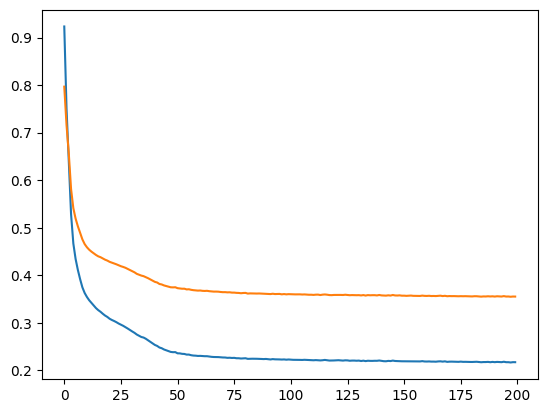

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['mae'])

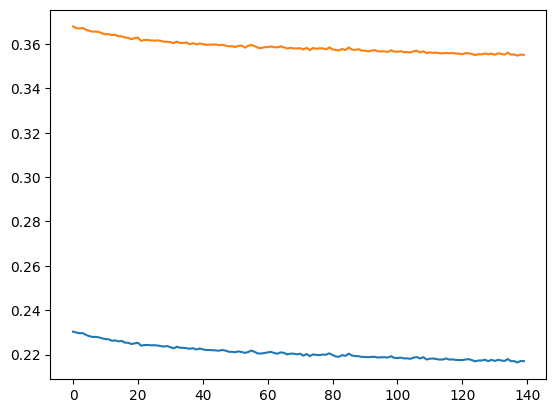

In [ ]:
plt.plot(history.history['loss'][60:])
plt.plot(history.history['mae'][60:])

Our model trained very good now and we can see it is still learning after 200 epoch and it is not noisy learning curve.  
lets save model and `embedd(encode)` data to latent space with `7` dims.

Lets save model Weights

In [50]:
weights_path = '/content/drive/MyDrive/Parkinson/autoencoder_DimReduction_weights.h5'

# # Save the weights
# ae.save_weights(weights_path)

# print("Model weights saved successfully to Google Drive.")

In [51]:
ae.load_weights(weights_path)
# load weights

In [52]:
embedded_data = encoder.predict(scaled_data)

152/152 [==============================] - 0s 2ms/step


In [53]:
embedded_data = pd.DataFrame(embedded_data, columns=['dim1','dim2', 'dim3', 'dim4','dim5', 'dim6', 'dim7'])

In [54]:
embedded_data.shape, pca_trans.shape, X.shape

((4858, 7), (4858, 7), (4858, 13))

Lets visualize our embedded data

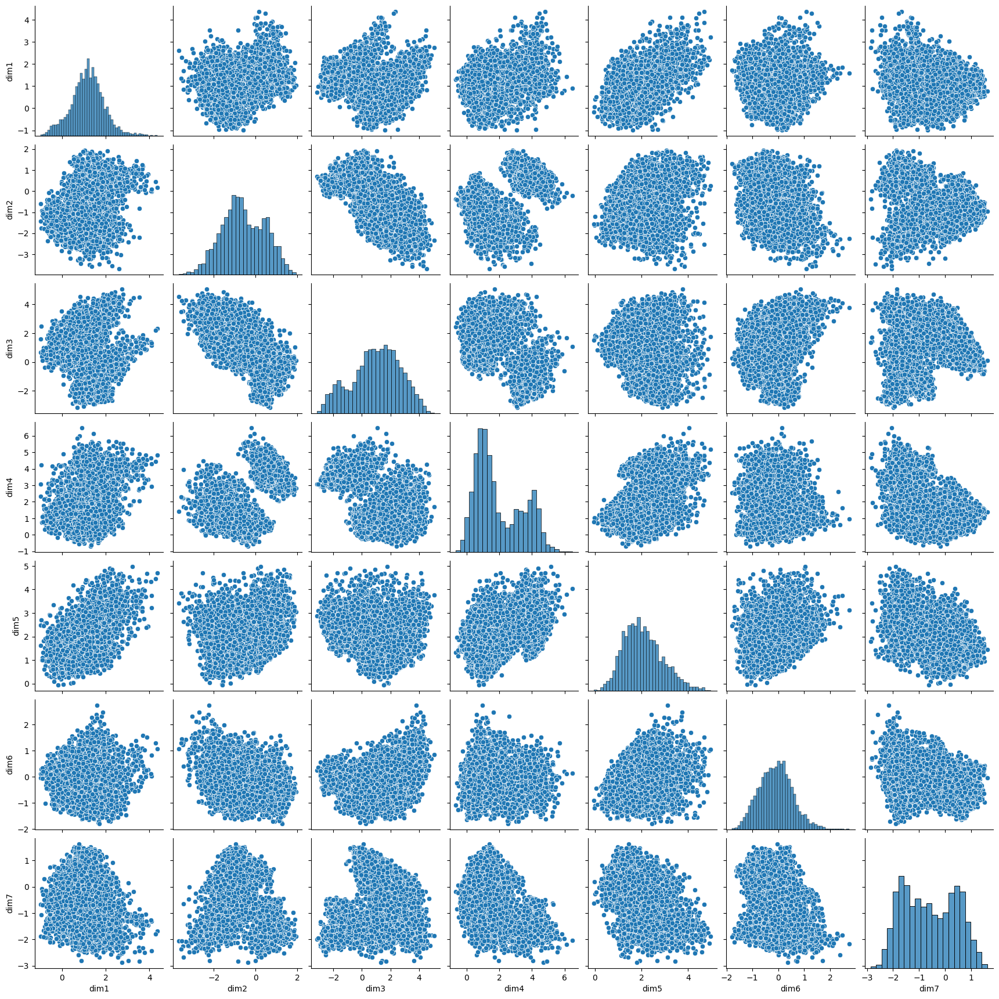

In [55]:
sns.pairplot(embedded_data)

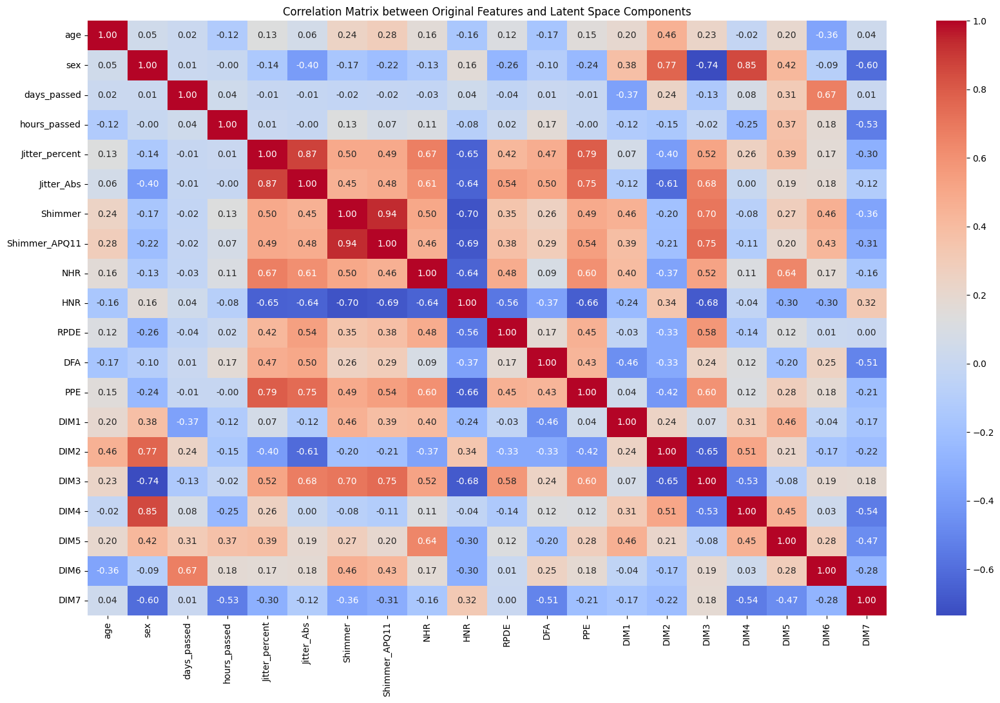

In [ ]:
 # Correlation Matrix
dim_corr_matrix = np.corrcoef(X.T, embedded_data.to_numpy().T)
dim_corr_matrix.shape

# Number of dims
feature_names = X.columns.to_list()
n_dims = len(embedded_data.columns)
all_ticks = feature_names + ['DIM'+str(i+1) for i in range(n_dims)]

# Plotting Correlation Matrix
plt.figure(figsize=(20, 12))
sns.heatmap(dim_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", xticklabels=all_ticks, yticklabels=all_ticks)
plt.title('Correlation Matrix between Original Features and Latent Space Components')
plt.show()

In [55]:
embedded_data.corr().style.background_gradient(cmap='coolwarm')

,dim1,dim2,dim3,dim4,dim5,dim6,dim7
dim1,1.000000,0.243519,0.072313,0.305909,0.458466,-0.039355,-0.172467
dim2,0.243519,1.000000,-0.647386,0.509241,0.214007,-0.168351,-0.224295
dim3,0.072313,-0.647386,1.000000,-0.531043,-0.080254,0.190461,0.184177
dim4,0.305909,0.509241,-0.531043,1.000000,0.454034,0.032821,-0.541201
dim5,0.458466,0.214007,-0.080254,0.454034,1.000000,0.283451,-0.469648
dim6,-0.039355,-0.168351,0.190461,0.032821,0.283451,1.000000,-0.276347
dim7,-0.172467,-0.224295,0.184177,-0.541201,-0.469648,-0.276347,1.000000


Compare PCA and Autoencoder using `reconstruction` metric.  
We want to see how our model create our not noisy data

In [56]:
recons_ae = ae.predict(scaled_data)
recons_ae.shape

152/152 [==============================] - 0s 2ms/step


(4858, 13)

In [57]:
mean_squared_error(scaled_data, recons_ae) # how much are they look like original data

0.10843271424445586

In [58]:
recons_pca = pca.inverse_transform(pca_trans) # lets see how well PCA reconstruct data
mean_squared_error(scaled_data, recons_pca)

0.11154946955203826

here we have results:  

1. our `AE Network` has done very good job to reduce dimension compare to `PCA`.
3. we need more data to train `deep learning model` very well rather than `PCA`.
4. with reconstruction metric we found that `Autoencoder` did better rather than `PCA`.
5. we have multicolinearity between 7 dims that created by `Autoencoder` but we do not have this situation in `PCA`.  

**Note:** We use our dataset to train our model to see which one is able to better capture relations

### Feature Crafting

In [59]:
def my_AE_V2():
  # clear session
  tf.keras.backend.clear_session()
  #Encode part
  inp = tf.keras.layers.Input(shape=(X.shape[1],))
  x = tf.keras.layers.Dense(units=X.shape[1] + 7, activation='relu')(inp)
  x = tf.keras.layers.Dense(units=X.shape[1] + 12, activation='relu')(x)
  x = tf.keras.layers.Dense(units=X.shape[1] + 17, activation=None, name='LatentSpace_layer')(x)
  # create Encode model
  enc = tf.keras.Model(inp, x, name='Encoder')
  #Decoder part
  inp_2 = tf.keras.layers.Input(shape=(X.shape[1] + 17,))
  x = tf.keras.layers.Dense(units=X.shape[1] + 12, activation='relu')(inp_2)
  x = tf.keras.layers.Dense(units=X.shape[1] + 7, activation='relu')(x)
  x = tf.keras.layers.Dense(units=X.shape[1], activation=None, name='Reconstruction_Layer')(x)
  # create decoder model
  dec = tf.keras.Model(inp_2, x, name='Decoder')
  # combine both encoder and decoder
  dec_instance = dec(enc.output)
  final_model = tf.keras.Model(enc.inputs, dec_instance, name='AutoEncoder')
  return final_model, enc, dec

crafter_AE, crafter_enc, decoder_model = my_AE_V2()
crafter_AE.summary()
# encoder.summary()
# decoder.summary()

Model: "AutoEncoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 13)]              0         
                                                                 
 dense (Dense)               (None, 20)                280       
                                                                 
 dense_1 (Dense)             (None, 25)                525       
                                                                 
 LatentSpace_layer (Dense)   (None, 30)                780       
                                                                 
 Decoder (Functional)        (None, 13)                1568      
                                                                 
Total params: 3153 (12.32 KB)
Trainable params: 3153 (12.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
crafter_AE.compile(optimizer='adam', loss='mse', metrics='mae')
history = crafter_AE.fit(noisy_scaled_data, scaled_data, batch_size=64, epochs=200, shuffle=True)

Epoch 1/200
76/76 [==============================] - 2s 4ms/step - loss: 0.8064 - mae: 0.7302
Epoch 2/200
76/76 [==============================] - 0s 3ms/step - loss: 0.5558 - mae: 0.5947
Epoch 3/200
76/76 [==============================] - 0s 3ms/step - loss: 0.4409 - mae: 0.5252
Epoch 4/200
76/76 [==============================] - 0s 4ms/step - loss: 0.3642 - mae: 0.4741
Epoch 5/200
76/76 [==============================] - 0s 5ms/step - loss: 0.3208 - mae: 0.4432
Epoch 6/200
76/76 [==============================] - 0s 5ms/step - loss: 0.2908 - mae: 0.4217
Epoch 7/200
76/76 [==============================] - 0s 5ms/step - loss: 0.2707 - mae: 0.4066
Epoch 8/200
76/76 [==============================] - 0s 4ms/step - loss: 0.2559 - mae: 0.3949
Epoch 9/200
76/76 [==============================] - 0s 3ms/step - loss: 0.2466 - mae: 0.3877
Epoch 10/200
76/76 [==============================] - 0s 3ms/step - loss: 0.2389 - mae: 0.3810
Epoch 11/200
76/76 [==============================] - 0s 3m

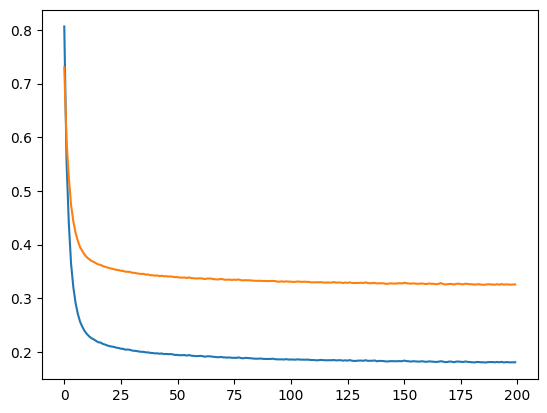

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['mae'])

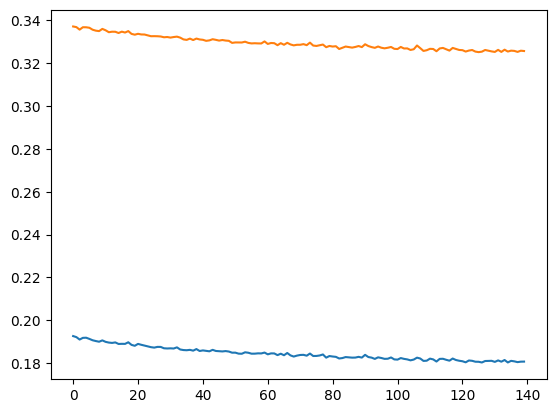

In [ ]:
plt.plot(history.history['loss'][60:])
plt.plot(history.history['mae'][60:])

at the end of learning we have some noisy steps but model is still learning.  
Lets extract our features and save model

Lets save model Weights

In [60]:
weights_path = '/content/drive/MyDrive/Parkinson/autoencoder_CraftedFeatures_weights.h5'

# # Save the weights
# crafter_enc.save_weights(weights_path)

# print("Model weights saved successfully to Google Drive.")

In [61]:
crafter_enc.load_weights(weights_path)
# load weights

In [62]:
dimensions_list = ["dim" + str(i) for i in range(1, 31)]

print(dimensions_list)


['dim1', 'dim2', 'dim3', 'dim4', 'dim5', 'dim6', 'dim7', 'dim8', 'dim9', 'dim10', 'dim11', 'dim12', 'dim13', 'dim14', 'dim15', 'dim16', 'dim17', 'dim18', 'dim19', 'dim20', 'dim21', 'dim22', 'dim23', 'dim24', 'dim25', 'dim26', 'dim27', 'dim28', 'dim29', 'dim30']


create new crafted data from not noisy data

In [63]:
new_data = crafter_enc.predict(scaled_data)
new_data = pd.DataFrame(new_data, columns=dimensions_list)

152/152 [==============================] - 0s 2ms/step


In [64]:
new_data.head()

,dim1,dim2,dim3,dim4,dim5,dim6,dim7,dim8,dim9,dim10,...,dim21,dim22,dim23,dim24,dim25,dim26,dim27,dim28,dim29,dim30
0,0.853332,-0.209367,-0.210142,0.411106,-0.437906,1.334036,-0.388025,0.646711,0.791620,-0.087564,...,0.832839,0.336066,-0.186708,1.454267,0.416521,-1.621428,0.485527,0.233296,-0.246784,-0.248549
1,1.235389,-0.198514,-0.334087,0.653351,-1.105982,1.386095,0.032067,0.613149,0.814066,0.018246,...,0.741308,0.305623,-0.052665,1.163720,0.490222,-1.907414,0.925087,0.321680,-0.497146,0.166008
2,0.956308,-0.334652,-0.263718,0.533192,-0.603705,1.370716,-0.250182,0.698624,0.800683,-0.549459,...,0.505228,0.341153,-0.229582,1.172416,0.511357,-1.550944,0.647771,0.081541,-0.238974,-0.360368
3,0.567513,-0.531682,-0.357813,0.358616,-0.091657,1.575940,-0.403810,1.019113,0.779072,-0.734146,...,0.381034,0.075521,-0.088307,1.216090,0.694120,-1.157494,0.675280,0.210777,-0.074732,-0.866069
4,0.959314,-0.202901,-0.387718,0.541503,-0.938913,1.255351,-0.033749,0.552057,0.716593,-0.078865,...,0.519149,0.224700,-0.124352,0.897965,0.422787,-1.560871,0.711281,0.229700,-0.454560,-0.002335


So this is our new dataset we created bu AE Network, we have `30 features`.

In [ ]:
new_data.corr().style.background_gradient(cmap='coolwarm')

,dim1,dim2,dim3,dim4,dim5,dim6,dim7,dim8,dim9,dim10,dim11,dim12,dim13,dim14,dim15,dim16,dim17,dim18,dim19,dim20,dim21,dim22,dim23,dim24,dim25,dim26,dim27,dim28,dim29,dim30
dim1,1.000000,0.045249,0.501450,0.138426,-0.427062,-0.390576,0.005545,-0.596360,0.055345,-0.203513,0.326328,0.085055,-0.124090,0.050792,-0.437006,0.007810,-0.478685,-0.332504,0.087056,0.110526,-0.050457,0.222412,0.425456,-0.497476,0.602693,-0.415756,0.570998,0.079954,-0.028417,0.291956
dim2,0.045249,1.000000,0.441740,0.472516,-0.488457,-0.240274,0.799450,-0.280286,0.016741,0.276252,-0.461610,-0.010441,-0.387997,0.058406,-0.091716,0.440879,0.246917,-0.053701,-0.329424,0.049460,-0.633562,0.603098,0.017312,-0.288285,-0.321794,-0.527454,0.018811,-0.252279,-0.319806,0.571270
dim3,0.501450,0.441740,1.000000,0.233659,-0.369735,-0.512553,0.204246,-0.360881,-0.211172,-0.111303,-0.045379,-0.339535,-0.604624,-0.357361,-0.382291,0.338420,-0.133723,-0.479391,0.002443,0.288201,-0.317763,0.097528,0.175180,0.011206,0.348405,-0.290538,0.422106,-0.255537,-0.157173,0.468078
dim4,0.138426,0.472516,0.233659,1.000000,-0.767151,0.060476,0.706328,-0.370961,0.141536,0.403309,-0.647388,-0.150735,0.130821,0.422426,-0.246658,0.173903,-0.245957,-0.160615,-0.466027,0.520591,-0.441312,0.438064,-0.564720,-0.166574,0.203717,-0.661484,0.177766,-0.692300,-0.647598,0.739168
dim5,-0.427062,-0.488457,-0.369735,-0.767151,1.000000,0.312081,-0.767987,0.633656,-0.093026,-0.451292,0.296944,0.265851,-0.002781,-0.552091,0.224065,-0.072408,0.433568,0.423702,0.594718,-0.618605,0.454526,-0.472836,0.334657,0.345506,-0.098849,0.793660,-0.403090,0.519306,0.697113,-0.904929
dim6,-0.390576,-0.240274,-0.512553,0.060476,0.312081,1.000000,-0.171452,0.511983,0.058347,-0.028879,-0.268587,0.431783,0.178949,-0.050758,0.511698,-0.009393,0.286170,0.650631,0.188915,-0.285500,0.179261,-0.134198,-0.280196,0.191187,-0.165861,0.162809,-0.274378,0.101137,0.150109,-0.343066
dim7,0.005545,0.799450,0.204246,0.706328,-0.767987,-0.171452,1.000000,-0.436608,0.082893,0.483443,-0.438759,-0.098106,-0.045319,0.522019,-0.067813,0.284531,-0.028130,-0.154557,-0.608351,0.299537,-0.644842,0.646108,-0.333002,-0.332699,-0.353316,-0.683113,0.103138,-0.459200,-0.557218,0.758418
dim8,-0.596360,-0.280286,-0.360881,-0.370961,0.633656,0.511983,-0.436608,1.000000,0.237934,-0.114511,-0.083255,0.005822,0.004122,-0.493865,0.231716,0.055445,0.512605,0.505360,0.256453,-0.368050,0.526100,-0.339744,0.125245,0.441877,-0.206259,0.414033,-0.170283,0.359071,0.416953,-0.640739
dim9,0.055345,0.016741,-0.211172,0.141536,-0.093026,0.058347,0.082893,0.237934,1.000000,0.213976,-0.196968,0.095069,0.334637,0.008821,-0.538582,-0.128954,0.122005,0.075121,-0.171635,-0.167305,0.446815,0.460157,0.209888,-0.328763,0.130602,-0.364633,0.100553,0.306280,0.107298,-0.144023
dim10,-0.203513,0.276252,-0.111303,0.403309,-0.451292,-0.028879,0.483443,-0.114511,0.213976,1.000000,-0.352653,-0.407336,-0.129686,0.522680,-0.089648,0.234121,0.308175,0.149628,-0.258434,0.379698,-0.120485,0.061955,-0.238098,-0.101842,-0.183071,-0.364160,-0.182536,-0.133159,-0.207168,0.439048


<Axes: >

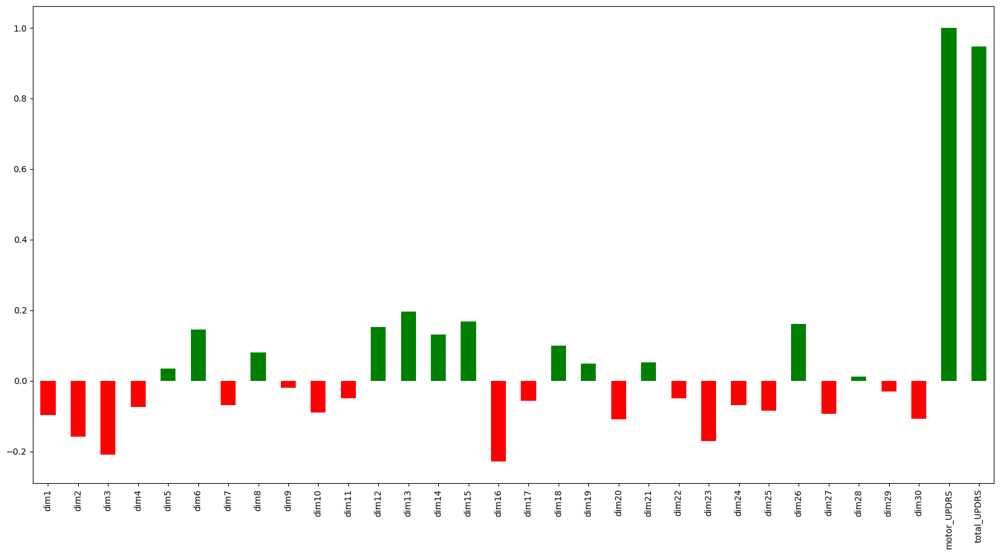

In [65]:
correlations = pd.concat([new_data, y], axis=1).corr()[['motor_UPDRS']]
colors = ['red' if corr < 0 else 'green' for corr in correlations['motor_UPDRS'].values]
correlations['motor_UPDRS'].plot(kind='bar', color=colors, figsize=(20,10))

As you can see we were success in creating some features that they have correlation with `motor_UPDRS` with magnitude of more than `0.2`.  

---

**Note:** Our data in new dataset are highly correlated, which is a little bit hard for regression analysis

Lets see grid plot of new dataset

## Clustering techniques

## Original Data  
Here we perform Clustering on Original data

In [103]:
# from sklearn.cluster import DBSCAN
# from sklearn.metrics import silhouette_score

# # Define the range of parameters to search
# eps_values = np.random.uniform(0, 10, 10)
# min_samples_values = np.random.randint(2, 11, 10)
# # eps_values = [0.5, 1.0, 1.5, 2.0, 2.5, 2.7, 3.0, 3.2]
# # min_samples_values = [2, 3, 4, 5, 6, 7, 8, 9, 10]

# # Initialize variables to store best parameters and corresponding silhouette score
# best_eps = None
# best_min_samples = None
# best_silhouette_score = -1  # Initialize with a very low value
# silhouette_scores = []
# # Perform grid search
# for eps in eps_values:
#     for min_samples in min_samples_values:
#         # Compute DBSCAN
#         db = DBSCAN(eps=eps, min_samples=min_samples).fit(scaled_data)
#         labels = db.labels_
#         # print(np.unique(labels))
#         if len(np.unique(labels)) == 1:
#           silhouette_avg = -1
#         else:
#           # Compute silhouette score
#           silhouette_avg = silhouette_score(scaled_data, labels)

#         silhouette_scores.append(silhouette_avg)
#         # Check if this combination of parameters gives better silhouette score
#         if silhouette_avg > best_silhouette_score:
#             best_silhouette_score = silhouette_avg
#             best_eps = eps
#             best_min_samples = min_samples

# print("Best epsilon:", best_eps)
# print("Best min_samples:", best_min_samples)
# print("Best silhouette score:", best_silhouette_score)


In [104]:
# plt.plot(silhouette_scores)

In [98]:
from sklearn.cluster import DBSCAN

# Compute DBSCAN
db = DBSCAN(eps=2.13, min_samples=4).fit(scaled_data)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

In [99]:

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 47


In [81]:
X.shape

(4858, 13)

In [100]:
# Plot result
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]


# Randomly select 3 pairs of features
selected_pairs = np.random.choice(range(X.shape[1]), size=(3, 2), replace=False)

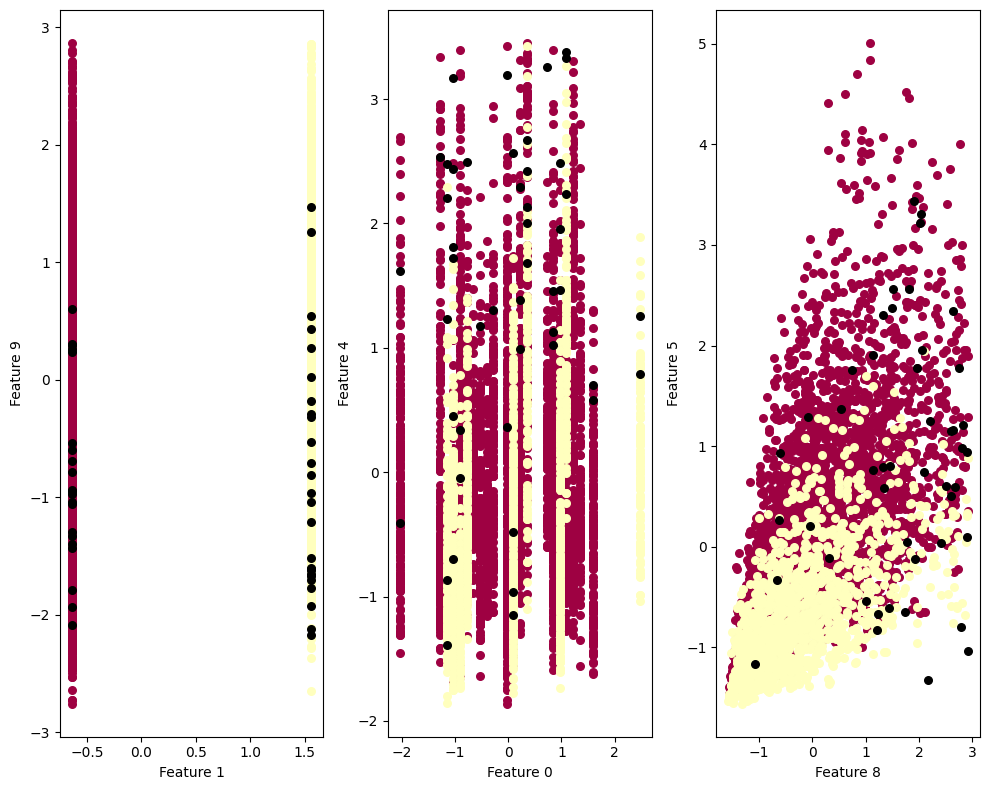

In [101]:
# Plot randomly selected pairs of features with predicted clusters
fig, axs = plt.subplots(1, 3, figsize=(10, 8))

for idx, (i, j) in enumerate(selected_pairs):
    for k in set(labels):
        if k == -1:
            col = [0, 0, 0, 1]  # Black used for noise.
            label = 'Noise'
        else:
            col = plt.cm.Spectral(k / n_clusters_)
            label = f'Cluster {k}'
        cluster_idx = np.where(((labels == k)))[0]  # Get the index of the cluster
        axs[idx].scatter(scaled_data_df.iloc[cluster_idx, i], scaled_data_df.iloc[cluster_idx, j], color=col, label=label, s=30)
    axs[idx].set_xlabel(f'Feature {i}')
    axs[idx].set_ylabel(f'Feature {j}')
    # axs[idx].legend(loc='upper right')

plt.tight_layout()
plt.show()


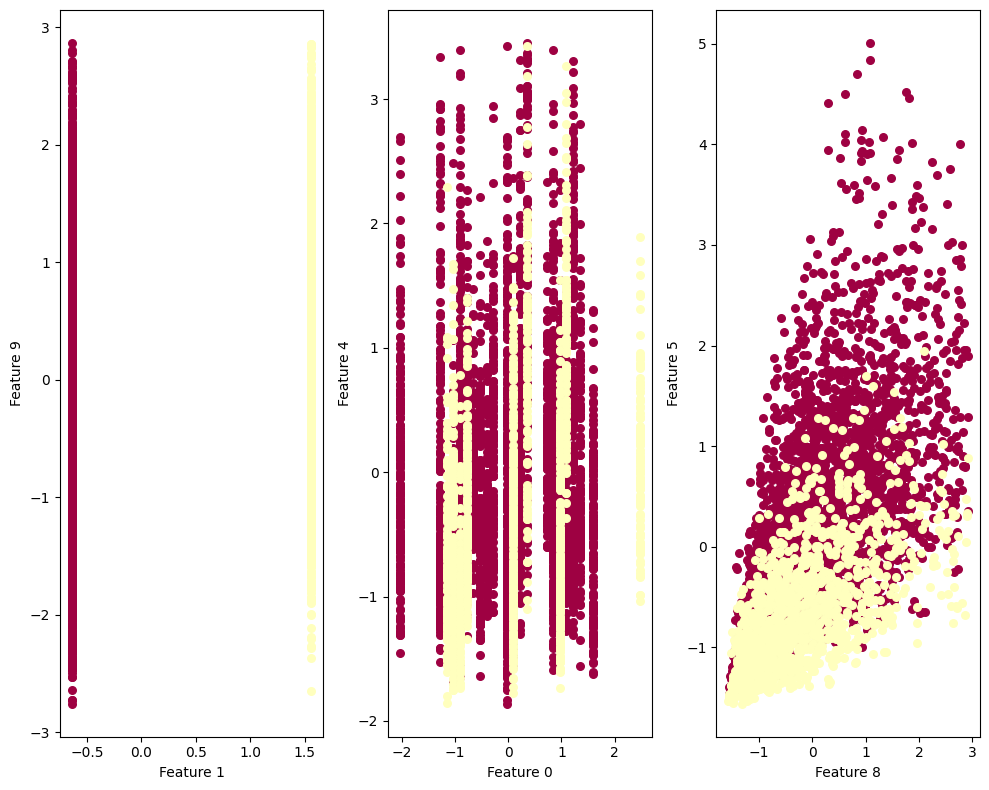

In [102]:
# Plot randomly selected pairs of features with predicted clusters
fig, axs = plt.subplots(1, 3, figsize=(10, 8))

for idx, (i, j) in enumerate(selected_pairs):
    for k in set(labels):
        if k == -1:
            col = [0, 0, 0, 1]  # Black used for noise.
            label = 'Noise'
        else:
            col = plt.cm.Spectral(k / n_clusters_)
            label = f'Cluster {k}'
        cluster_idx = np.where(((labels == k)  & (k != -1)))[0]  # Get the index of the cluster | filtered noise
        axs[idx].scatter(scaled_data_df.iloc[cluster_idx, i], scaled_data_df.iloc[cluster_idx, j], color=col, label=label, s=30)
    axs[idx].set_xlabel(f'Feature {i}')
    axs[idx].set_ylabel(f'Feature {j}')
    # axs[idx].legend(loc='upper right')

plt.tight_layout()
plt.show()


We can see the clusters in 2d plot are still visual and we can distiguished them in surface.
But we can see DBScan estimate 47 noise points we can see in above plots as black dots.  
**We can remove them as an cleaning proccess**

In [108]:
X[labels==-1] # these are outliers detected by DBScan

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
29,72,0,47,16,0.00772,0.000040,0.05514,0.03860,0.018124,20.744,0.41898,0.54621,0.218980
104,72,0,75,16,0.00708,0.000034,0.06087,0.04843,0.022042,20.164,0.46492,0.54246,0.218520
136,72,0,131,16,0.00688,0.000041,0.04896,0.03018,0.011702,20.937,0.49023,0.55236,0.140370
734,63,0,5,8,0.00743,0.000055,0.06334,0.04760,0.050076,19.661,0.52358,0.64330,0.240100
953,73,1,15,13,0.00870,0.000047,0.04736,0.03270,0.046591,19.606,0.56726,0.72053,0.186370
1135,68,0,35,8,0.00904,0.000073,0.01074,0.00826,0.031349,24.509,0.63859,0.69975,0.418520
1784,58,1,147,8,0.00479,0.000023,0.01529,0.00989,0.037942,26.574,0.33551,0.58658,0.221150
1786,58,1,168,9,0.00555,0.000020,0.02069,0.01556,0.049848,24.327,0.60738,0.54885,0.202520
1876,65,0,201,13,0.00559,0.000029,0.04186,0.02694,0.011151,23.581,0.33704,0.65074,0.134640
2095,66,1,27,7,0.00395,0.000023,0.06137,0.03943,0.032422,22.684,0.58592,0.60304,0.062530


In [109]:
X[labels==-1].describe()

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
count,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000,47.000000
mean,65.170213,0.553191,105.382979,13.021277,0.007610,0.000052,0.042598,0.033266,0.036633,20.048021,0.558109,0.667295,0.258364
std,8.560067,0.502538,60.266998,4.664805,0.002482,0.000024,0.015102,0.012327,0.011888,2.868520,0.097393,0.070259,0.105081
min,49.000000,0.000000,5.000000,7.000000,0.002180,0.000010,0.010740,0.008260,0.006517,15.815000,0.335510,0.542460,0.062530
25%,57.000000,0.000000,47.500000,9.000000,0.006135,0.000035,0.033900,0.025875,0.031732,17.579000,0.486975,0.613295,0.187955
50%,66.000000,1.000000,126.000000,12.000000,0.007740,0.000051,0.045690,0.034330,0.038874,19.606000,0.552210,0.647950,0.249270
75%,72.000000,1.000000,156.000000,17.500000,0.009620,0.000070,0.054645,0.043640,0.047092,21.884000,0.634545,0.734760,0.357325
max,85.000000,1.000000,201.000000,21.000000,0.011470,0.000102,0.063340,0.050790,0.051214,27.236000,0.725160,0.816260,0.421160


In [111]:
X.describe()

,age,sex,days_passed,hours_passed,Jitter_percent,Jitter_Abs,Shimmer,Shimmer_APQ11,NHR,HNR,RPDE,DFA,PPE
count,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000,4858.000000
mean,65.247015,0.290449,93.226019,12.670852,0.004887,0.000036,0.027393,0.022496,0.018621,22.618966,0.526186,0.650905,0.199296
std,8.005192,0.454016,52.976642,4.578523,0.001949,0.000019,0.011797,0.009624,0.011178,3.139772,0.092295,0.069602,0.067531
min,49.000000,0.000000,0.000000,4.000000,0.001260,0.000006,0.003060,0.002490,0.001050,13.969000,0.258780,0.514040,0.023210
25%,58.000000,0.000000,48.000000,9.000000,0.003440,0.000021,0.018263,0.015033,0.009960,20.321000,0.459810,0.594542,0.150058
50%,65.000000,0.000000,93.000000,11.000000,0.004550,0.000032,0.025195,0.021020,0.016465,22.497000,0.527385,0.641330,0.192865
75%,72.000000,1.000000,139.000000,17.000000,0.005987,0.000046,0.034547,0.028645,0.025319,24.780000,0.595408,0.707530,0.242300
max,85.000000,1.000000,215.000000,23.000000,0.011610,0.000133,0.064930,0.050980,0.051235,31.618000,0.804500,0.828600,0.439290


In [122]:
from scipy import stats

df1 = X[labels==-1]
df2 = X[labels!=-1]
# Determine which dataframe has fewer rows
min_length = min(len(df1), len(df2))

# Choose a random sample from the dataframe with more rows
if len(df1) < len(df2):
    df2_matched = df2.sample(n=min_length, random_state=42)
    df1_matched = df1
else:
    df1_matched = df1.sample(n=min_length, random_state=42)
    df2_matched = df2

# Extract pairs of columns by column positions
pairs_by_positions = list(zip(df1.columns, df2.columns))

# Perform t-test for each pair of corresponding columns
for col1, col2 in pairs_by_positions:
      t_statistic, p_value = stats.ttest_rel(df1_matched[col1], df2_matched[col2])
      print(f"Paired t-test for columns {col1} and {col2}:")
      print("T-statistic:", t_statistic)
      print("P-value:", p_value)

      # Interpret the results
      alpha = 0.05
      print(f"Columns:{col2, col1}")
      if p_value < alpha:
          print("Reject the null hypothesis: There is a significant difference between the paired columns.")
      else:
          print("Fail to reject the null hypothesis: There is no significant difference between the paired columns.")
      print()

Paired t-test for columns age and age:
T-statistic: -0.7011512714831442
P-value: 0.4867406304061942
Columns:('age', 'age')
Fail to reject the null hypothesis: There is no significant difference between the paired columns.

Paired t-test for columns sex and sex:
T-statistic: 1.873886437775616
P-value: 0.06730617164224637
Columns:('sex', 'sex')
Fail to reject the null hypothesis: There is no significant difference between the paired columns.

Paired t-test for columns days_passed and days_passed:
T-statistic: 1.3348363993884795
P-value: 0.18849919393534847
Columns:('days_passed', 'days_passed')
Fail to reject the null hypothesis: There is no significant difference between the paired columns.

Paired t-test for columns hours_passed and hours_passed:
T-statistic: -0.16507627287803503
P-value: 0.8696072673230308
Columns:('hours_passed', 'hours_passed')
Fail to reject the null hypothesis: There is no significant difference between the paired columns.

Paired t-test for columns Jitter_percent

As we can see we have difference between original distribution and data points recognized as noise so we have two options:  
> 1. Replace them with datapoints related to original distribution  
> 2. Remove them

We choose second one because replace data can result in wrong direction and it is a percise work and needs good domain knowledge

In [128]:
mask = (labels != -1)
mask

array([ True,  True,  True, ...,  True,  True,  True])

In [124]:
idx = X[labels==-1].index
X.drop(index=idx, inplace=True)
y.drop(index=idx, inplace=True)
# rearrange indices
X.reset_index(drop=True, inplace=True)
y.reset_index(drop=True, inplace=True)



In [140]:
# scaled data again
scaled_data = scaler.fit_transform(X)
scaled_data_df = pd.DataFrame(scaled_data, columns=scaler.get_feature_names_out())

# create Embedded data, pca, crafted again
pca = PCA(7)
pca_trans = pca.fit_transform(scaled_data)
pca_trans = pd.DataFrame(pca_trans, columns=['PC1','PC2', 'PC3', 'PC4','PC5', 'PC6', 'PC7'])

new_data = crafter_enc.predict(scaled_data)
new_data = pd.DataFrame(new_data, columns=dimensions_list)

embedded_data = encoder.predict(scaled_data)
embedded_data = pd.DataFrame(embedded_data, columns=['dim1','dim2', 'dim3', 'dim4','dim5', 'dim6', 'dim7'])



151/151 [==============================] - 0s 1ms/step


## Crafted Data  
Here we perform clustering on Embedded Data or new crafted data with DNN Models

In [137]:
# I will update this section

# Supervised Analysis

## Traditional models  
Here we try to use Traditional machine learning for this task.

We are going to use two type of model for this analysis one of them is `traditional supervised learning model` for `regression analysis` with fine-tuning approaches and the second is `Deep learning model` with its fine-tuning approaches, we also may use `grid search` during `fine-tuning` procedure to find better `hyperparameters` for both `traditional` and `Deep learning` models   

## Preprocessing
> Preprocess data for Predictive Analysis   
Our data are already in numerical situation, we may want to change them to create more robust distribution and optimized for model

In [142]:
y.describe()

,motor_UPDRS,total_UPDRS
count,4811.000000,4811.000000
mean,21.212074,29.054388
std,8.166253,10.777083
min,5.037700,7.000000
25%,14.736000,21.324000
50%,20.576000,27.454000
75%,27.663000,36.626500
max,39.511000,54.992000


We may want to rescale y dataset

### Linear Regression

We have `two` target variables and we know these two variable have `strong positive pearson correlation` with each other therefore we pick up `one variable` for our regression analysis.

We use gathered all dataset we have and we create different combination of them and feed them to base traditionl model(Linear Regression) to get an intuition of which dataset predict better our target variable.

In [145]:
latent_plus_org = pd.concat([X, embedded_data], axis=1)
latent_plus_pca = pd.concat([pca_trans, embedded_data], axis=1)
latent_plus_pca_plus_org = pd.concat([pca_trans, embedded_data, X], axis=1)
pca_plus_org = pd.concat([X, pca_trans], axis=1)


new_data_plus_latent_plus_pca_plus_org = pd.concat([pca_trans, embedded_data, X, new_data], axis=1)
new_data_plus_latent_plus_pca = pd.concat([pca_trans, embedded_data, new_data], axis=1)
new_data_plus_org = pd.concat([X, new_data], axis=1)
new_data_plus_pca = pd.concat([new_data, pca_trans], axis=1)
new_data_plus_latent = pd.concat([new_data, embedded_data], axis=1)

# our baseline model is traditional linear regression
data_name = {'org':X,
             'new':new_data,
             'pca':pca_trans,
             'latent':embedded_data,
             'latent_plus_org':latent_plus_org,
             'latent_plus_pca':latent_plus_pca,
             'latent_plus_pca_plus_org':latent_plus_pca_plus_org,
             'pca_plus_org':pca_plus_org,
             'new_data_plus_latent_plus_pca_plus_org':new_data_plus_latent_plus_pca_plus_org,
             'new_data_plus_latent_plus_pca':new_data_plus_latent_plus_pca,
             'new_data_plus_org':new_data_plus_org,
             'new_data_plus_pca':new_data_plus_pca,
             'new_data_plus_latent':new_data_plus_latent
             }
scores = {}
for k,v in data_name.items():
  X_train, X_test, y_train, y_test = train_test_split(v.to_numpy(), y['motor_UPDRS'].to_numpy(),
                                                      shuffle=True, test_size=0.3)

  lin_reg = LinearRegression()
  lin_reg.fit(X_train, y_train)
  sc = lin_reg.score(X_test, y_test)
  scores[k] = sc

In [146]:
scores

{'org': 0.17188784899496,
 'new': 0.2592403473906586,
 'pca': 0.0974782419517507,
 'latent': 0.07560516137087514,
 'latent_plus_org': 0.1849023712414275,
 'latent_plus_pca': 0.10267530977493111,
 'latent_plus_pca_plus_org': 0.21033014727811017,
 'pca_plus_org': 0.15795458854703814,
 'new_data_plus_latent_plus_pca_plus_org': 0.34454018894451,
 'new_data_plus_latent_plus_pca': 0.3076937696738039,
 'new_data_plus_org': 0.32478777861319785,
 'new_data_plus_pca': 0.3129090862282996,
 'new_data_plus_latent': 0.31099765685792846}

We can see traditional linear regression model could not perform well on our datasets, but here we can see which one has better r2 score as a metrics to our predictive analysis goal

## Deep Learning models

Here we try to create good `deep learning architecture` to capture relations between `dependent` and `indepentent` variables.

In [147]:
X_train, X_test, y_train, y_test = train_test_split(new_data_plus_latent_plus_pca.to_numpy(), y['motor_UPDRS'].to_numpy(),
                                                      shuffle=True, test_size=0.3)

# new_data_plus_pca ok
# new_data_plus_latent_plus_pca ok top
# new_data_plus_latent ok
# new_data_plus_org no
# new_data_plus_latent_plus_pca_plus_org no


In [148]:
# create functional api model
def regression_model():
  #cleaning
  tf.keras.backend.clear_session()
  # regulizers
  # l1 = tf.keras.regularizers.L1(l1=0.3)
  # l2 = tf.keras.regularizers.L2(l2=0.5)
  #model layers
  inp_load = tf.keras.layers.Input(shape=(X_train.shape[1],))
  x1 = tf.keras.layers.Dense(units=50, activation='relu')(inp_load)
  x2 = tf.keras.layers.Dense(units=32, activation='relu')(x1)
  x3 = tf.keras.layers.Dropout(rate=0.25)(x2)
  x4 = tf.keras.layers.Dense(units=25, activation='relu')(x3)
  x5 = tf.keras.layers.Dropout(rate=0.25)(x4)
  x6 = tf.keras.layers.Dense(units=17, activation='sigmoid')(x5)
  x7 = tf.keras.layers.Dense(units=13, activation='tanh')(x6)
  x8 = tf.keras.layers.Dense(units=1, activation='linear')(x7)
  x9 = tf.keras.layers.Lambda(lambda x: x * 10)(x8) # rescale data to target

  # construct model class
  myml = tf.keras.Model(inp_load, x9)
  myml.summary()
  return myml

In [149]:
rmodel = regression_model()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 44)]              0         
                                                                 
 dense (Dense)               (None, 50)                2250      
                                                                 
 dense_1 (Dense)             (None, 32)                1632      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 25)                825       
                                                                 
 dropout_1 (Dropout)         (None, 25)                0         
                                                                 
 dense_3 (Dense)             (None, 17)                442   

In [150]:
lr = 1e-6
opt = tf.keras.optimizers.Adam(learning_rate=lr)
rmodel.compile(optimizer=opt, loss='mse', metrics=[tf.metrics.R2Score()])
def scheduler(epoch):
  return 1e-6 * 10**(epoch/10)
lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

Here we want to choose a better learning rate to train model faster

In [151]:
hist = rmodel.fit(X_train, y_train, epochs=60, batch_size=64, shuffle=True, callbacks=[lr_callback])

Epoch 1/60
53/53 [==============================] - 2s 3ms/step - loss: 566.4018 - r2_score: -7.4883 - lr: 1.0000e-06
Epoch 2/60
53/53 [==============================] - 0s 3ms/step - loss: 563.4650 - r2_score: -7.4443 - lr: 1.2589e-06
Epoch 3/60
53/53 [==============================] - 0s 3ms/step - loss: 561.8406 - r2_score: -7.4200 - lr: 1.5849e-06
Epoch 4/60
53/53 [==============================] - 0s 3ms/step - loss: 559.9603 - r2_score: -7.3918 - lr: 1.9953e-06
Epoch 5/60
53/53 [==============================] - 0s 3ms/step - loss: 554.8735 - r2_score: -7.3156 - lr: 2.5119e-06
Epoch 6/60
53/53 [==============================] - 0s 3ms/step - loss: 551.0572 - r2_score: -7.2584 - lr: 3.1623e-06
Epoch 7/60
53/53 [==============================] - 0s 3ms/step - loss: 546.8964 - r2_score: -7.1960 - lr: 3.9811e-06
Epoch 8/60
53/53 [==============================] - 0s 3ms/step - loss: 539.4592 - r2_score: -7.0846 - lr: 5.0119e-06
Epoch 9/60
53/53 [==============================] - 0s 3

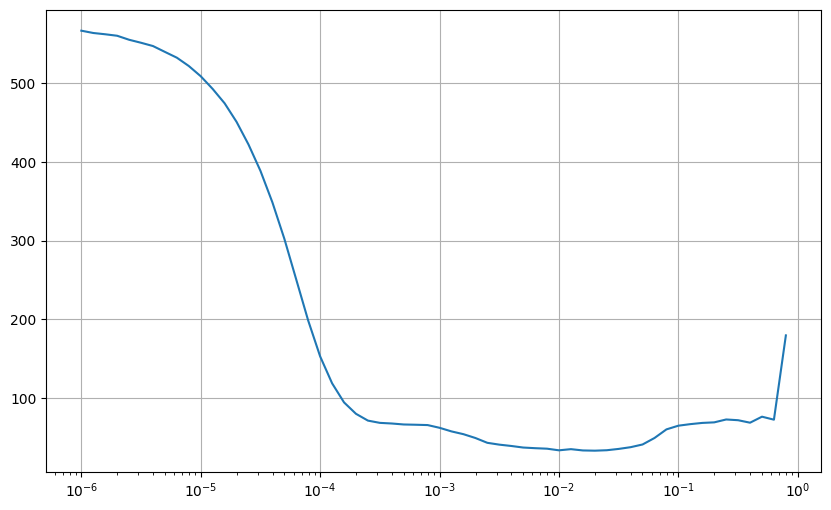

In [152]:
lr_ranges = 1e-6 * 10**(np.arange(60)/10)

# Set the figure size
plt.figure(figsize=(10, 6))

# Set the grid
plt.grid(True)

# Plot the loss in log scale
plt.semilogx(lr_ranges, hist.history['loss'])


2We can see best learning rate is somewhere between 10^-3 - 10^-2

In [164]:
best_model_path = '/content/drive/MyDrive/Parkinson/best_model_v2.h5'
rmodel = regression_model()
checkpoint = tf.keras.callbacks.ModelCheckpoint(best_model_path,
                             monitor='val_loss',  # Monitor the validation loss
                             save_best_only=True,  # Save only the best model
                             mode='min',  # Minimize the monitored quantity
                             verbose=0)

lr = 1e-3
opt = tf.keras.optimizers.Adam(learning_rate=lr)
# reduce_cl = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.0002, patience=30, mode='min')

def scheduler(epoch): # because of this task it is hard to converge after 200 epoch and maybe we lock in an local minimum so we want an jump by increasing learning.
  if epoch == 200:
    return 2e-3
  return 1e-3
lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

rmodel.compile(optimizer=opt, loss='mse', metrics=[tf.metrics.R2Score()])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 44)]              0         
                                                                 
 dense (Dense)               (None, 50)                2250      
                                                                 
 dense_1 (Dense)             (None, 32)                1632      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 25)                825       
                                                                 
 dropout_1 (Dropout)         (None, 25)                0         
                                                                 
 dense_3 (Dense)             (None, 17)                442   

Because we have a Regression Problem We need to increase Epoch for better convergence.

In [165]:
hist = rmodel.fit(X_train, y_train, epochs=300, batch_size=128, validation_data=(X_test,y_test), shuffle=True, callbacks=[lr_callback, checkpoint])
# hist = rmodel.fit(X_train, y_train, epochs=300, batch_size=128, validation_data=(X_test,y_test), shuffle=True, callbacks=[lr_callback])

Epoch 1/300
27/27 [==============================] - 2s 16ms/step - loss: 431.0894 - r2_score: -5.4605 - val_loss: 223.8356 - val_r2_score: -2.3643 - lr: 0.0010
Epoch 2/300
27/27 [==============================] - 0s 9ms/step - loss: 153.7690 - r2_score: -1.3045 - val_loss: 87.4898 - val_r2_score: -0.3150 - lr: 0.0010
Epoch 3/300
27/27 [==============================] - 0s 7ms/step - loss: 78.1399 - r2_score: -0.1710 - val_loss: 66.8443 - val_r2_score: -0.0047 - lr: 0.0010
Epoch 4/300
27/27 [==============================] - 0s 7ms/step - loss: 67.0770 - r2_score: -0.0052 - val_loss: 66.5947 - val_r2_score: -9.2971e-04 - lr: 0.0010
Epoch 5/300
27/27 [==============================] - 0s 7ms/step - loss: 66.5137 - r2_score: 0.0032 - val_loss: 66.4167 - val_r2_score: 0.0017 - lr: 0.0010
Epoch 6/300
27/27 [==============================] - 0s 7ms/step - loss: 66.4425 - r2_score: 0.0043 - val_loss: 65.9314 - val_r2_score: 0.0090 - lr: 0.0010
Epoch 7/300
27/27 [=============================

We can see after `300` epochs we stuck in the `local minimum` but we have better `MSE` rather than traditional models, and ofcourse we can make our model better by changing the `architecture` and add more `flexible` and `complexity` into it.

---

**Note:** You have to be aware aboute `bias variance` tradeoff

In [166]:
# # Path to the saved model in .pb format
# saved_model_path = '/content/drive/MyDrive/Parkinson/best_model.h5'
saved_model_path = '/content/drive/MyDrive/Parkinson/best_model_v2.h5'

# # Load the saved model
r2model = tf.keras.models.load_model(saved_model_path)

In [173]:
pred_best = r2model.predict(X_test)
np.sqrt(mean_squared_error(y_pred=pred_best, y_true=y_test))

46/46 [==============================] - 0s 2ms/step


2.6475619354059337

In [168]:
pred = rmodel.predict(X_test)
np.sqrt(mean_squared_error(y_pred=pred, y_true=y_test))

46/46 [==============================] - 1s 8ms/step


2.806090855466131

We can see our Deep Learning model is way more better than our Traditional Linear Regression model

In [156]:
hist.history.keys()

dict_keys(['loss', 'r2_score', 'val_loss', 'val_r2_score', 'lr'])

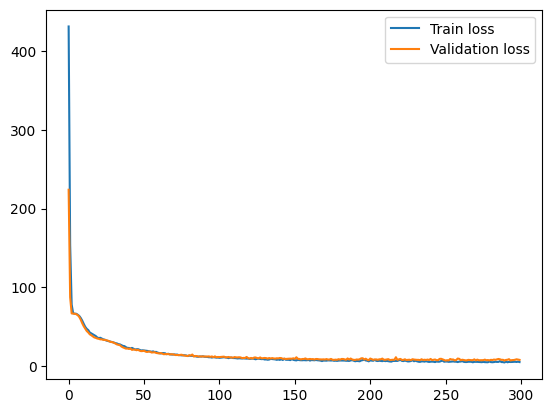

In [169]:
plt.plot(hist.history['loss'], label='Train loss')
plt.plot(hist.history['val_loss'], label='Validation loss')

plt.legend()

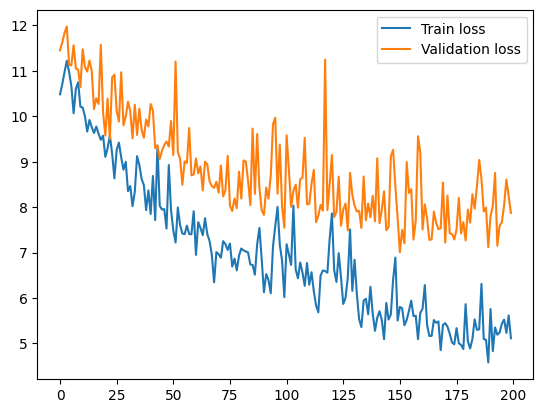

In [170]:
plt.plot(hist.history['loss'][100:], label='Train loss')
plt.plot(hist.history['val_loss'][100:], label='Validation loss')

plt.legend()

Model is still learning but it is has noisy and jumpy learning at last iterations.  

Now we can see how well our model was able to predict distribution of our test data and where we have deviation from ground truth distribution

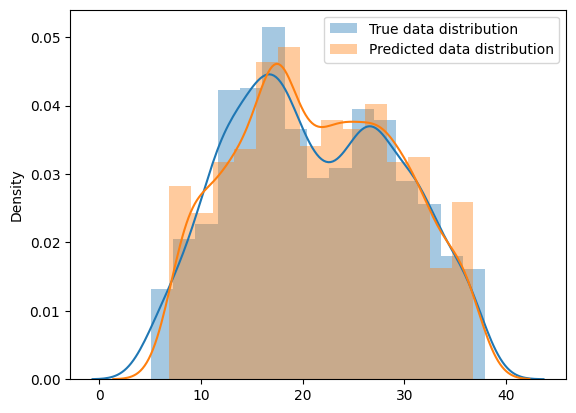

In [174]:
sns.distplot(y_test, label='True data distribution')
sns.distplot(pred_best, label='Predicted data distribution')

plt.legend()

We can also visualize and get som intuitive insights from errors distribution and see how is distribution of error variable.  
**Note:** We want a our distribution to be as much as possible skinny and tall.

In [175]:
errors= y_test - pred_best

<Axes: ylabel='Density'>

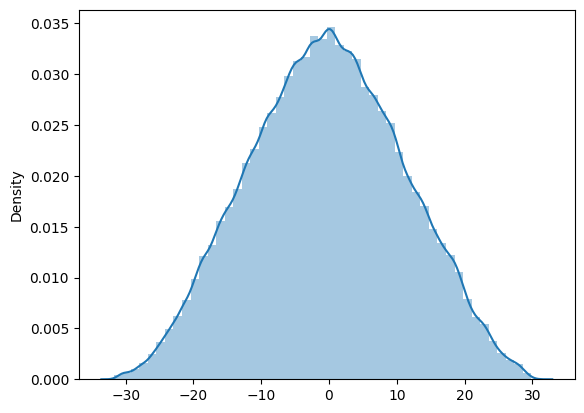

In [176]:
sns.distplot(errors)

# Conclusion  
I will update This Section.  
**Note**: in this version by using clustering and more cleaning dataset we increase the accuracy of our DNN model

#Next Steps
All data science projects need next steps and here we have a few steps that we can do it in future.  
* more analysis on `features` (feature engineering) to capture more `importance features` and `relations`.
* **`more cleaning and preprocessing on original dataset`**